<a href="https://colab.research.google.com/github/JoKoum/speech-emotion-detection/blob/main/emotion_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project in Multimodal Machine Learning Class: Emotion Detection
---

### John Koumentis, Sotiris Panopoulos

The project evaluates the performance of traditional Machine Learning techniques and Deep Learning methods over predicting the correct emotion of the given human speech audio example.

The [SAVEE](http://kahlan.eps.surrey.ac.uk/savee/Download.html) and the [TESS](https://www.kaggle.com/ejlok1/toronto-emotional-speech-set-tess) datasets were selected for the emotion detection task. 

The first one consists of recordings from four male actors in seven different emotions (anger, disgust, fear, happiness, pleasant surprise, sadness, and neutral).Recordings consist of 15 phonetically-balanced TIMIT sentences per emotion (with additional 30 sentences for neutral state) resulting into corpus of 480 British English utterances.

The second one consists of a set of 200 target words spoken in the carrier phrase 'Say the word _' by two actresses and recordings were made of the set portraying each of seven emotions (anger, disgust, fear, happiness, pleasant surprise, sadness, and neutral). There are 2800 data points (audio files) in total.

### Download and extract audio samples from [SAVEE](http://kahlan.eps.surrey.ac.uk/savee/Download.html) dataset

In [ ]:
%%capture
!gdown https://drive.google.com/uc?id=1cTpcFmSty3Wc40EhBdwkaDoMAhzf_K34
!unzip "./AudioData.zip" -d "./"

### Download and extract audio samples from [TESS](https://www.kaggle.com/ejlok1/toronto-emotional-speech-set-tess) dataset

In [ ]:
%%capture
!gdown https://drive.google.com/uc?id=1mO4r3s2GN4rqcGEzflATCsUN9zJL0wm0
!unzip "./TESS.zip" -d "./"
!mv "./TESS Toronto emotional speech set data" "./TESS"

### Install and import the required libraries

In [ ]:
%%capture
!pip3 install pyaudioanalysis
!pip3 install eyeD3==0.9.5
!pip3 install pydub==0.24.0

In [ ]:
import os
import numpy as np
import pandas as pd
from pyAudioAnalysis import MidTermFeatures, audioBasicIO
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from shutil import copy2
import pandas as pd
import IPython
import pandas as pd
import seaborn as sn
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, make_scorer, confusion_matrix
from sklearn.feature_selection import VarianceThreshold

In [ ]:
class_names = ['happy', 'neutral', 'surprise', 'angry', 'disgust', 'fear', 'sad']

Two samples are dropped from the TESS dataset, since their presence resulted in erroneous behavior at the deep learning analysis conducted. Moreover, the OAF_food_fear one has a different sampling rate than the rest of the dataset. We decided to remove it as well.

In [ ]:
!rm './TESS/YAF_angry/YAF_germ_angry.wav'
!rm './TESS/YAF_fear/YAF_neat_fear.wav'
!rm './TESS/OAF_Fear/OAF_food_fear.wav'

In [ ]:
dir_list = ['./AudioData', './TESS']

In [ ]:
def plot_items_count(dir_list):

  """
  Countplots for each class in the two datasets.
  Returns the sampling rate on both datasets.
  """

  emotion_savee = []
  emotion_tess = []

  sampling_rate_savee = []
  sampling_rate_tess = []

  for item in os.listdir(dir_list[0]):
      item_dir = os.path.join('./AudioData',item)
      if item != 'Info.txt':
        for wav_file in os.listdir(item_dir):
          sampling_rate, _ = audioBasicIO.read_audio_file(item_dir+'/'+wav_file)
          sampling_rate_savee.append(sampling_rate)
          if wav_file[0] == 'a':
            emotion_savee.append('angry')
          elif wav_file[0] == 'd':
            emotion_savee.append('disgust')
          elif wav_file[0] == 'f':
            emotion_savee.append('fear')
          elif wav_file[0] == 'h':
            emotion_savee.append('happy')
          elif wav_file[0] == 'n':
            emotion_savee.append('neutral')
          elif wav_file[0] == 's' and wav_file[1] == 'a':
            emotion_savee.append('sad')
          else:
            emotion_savee.append('surprise')
  sn.countplot(emotion_savee)
  plt.title('SAVEE emotions count')
  plt.show()
  sampling_rate_savee = set(sampling_rate_savee)

  for folder in os.listdir(dir_list[1]):
      if 'angry' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('angry')
      elif 'disgust' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('disgust')
      elif 'fear' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('fear')
      elif 'Fear' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('fear')
      elif 'happy' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('happy')
      elif 'neutral' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('neutral')
      elif 'sad' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('sad')
      elif 'Sad' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('sad')
      elif 'surprise' in folder:
        for wav_file in os.listdir('./TESS/'+folder):
          sampling_rate, _ = audioBasicIO.read_audio_file('./TESS/'+folder+'/'+wav_file)
          sampling_rate_tess.append(sampling_rate)
          emotion_tess.append('surprise')

  sn.countplot(emotion_tess)
  plt.title('TESS emotions count')
  plt.show()

  sampling_rate_tess = set(sampling_rate_tess)

  return sampling_rate_savee, sampling_rate_tess

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



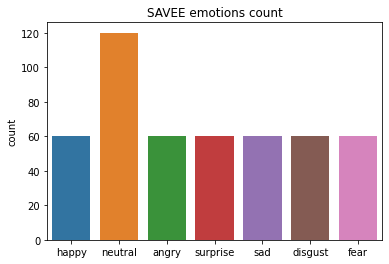

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



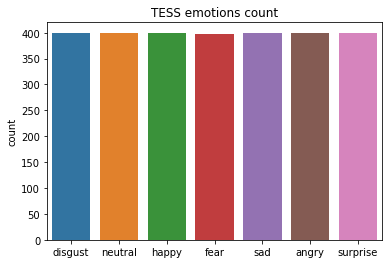

In [ ]:
sampling_rate_savee, sampling_rate_tess = plot_items_count(dir_list)

In [ ]:
print('SAVEE dataset sampling rate: ', sampling_rate_savee)
print('TESS dataset sampling rate: ', sampling_rate_tess)

SAVEE dataset sampling rate:  {44100}
TESS dataset sampling rate:  {24414}


### An audio sample per speaker for the 'happy' emotion:

In [ ]:
IPython.display.Audio('./AudioData/DC/h01.wav')

In [ ]:
IPython.display.Audio('./AudioData/JE/h01.wav')

In [ ]:
IPython.display.Audio('./AudioData/JK/h01.wav')

In [ ]:
IPython.display.Audio('./AudioData/KL/h01.wav')

In [ ]:
IPython.display.Audio('./TESS/OAF_happy/OAF_boat_happy.wav')

In [ ]:
IPython.display.Audio('./TESS/YAF_happy/YAF_boat_happy.wav')

### Load audio files
---
Audio files are loaded and split into train and test folders. Each of those folders contains subfolders named after the respective emotion of the audio files inside.

In order to avoid overfitting on actor voices, the test set contains samples only for one of the dataset actors, not present at the training set.

In [ ]:
def load_files(dir_list):
  """
  Load files from the two datasets and split to training and test sets
  Input: Directories list
  Output: Train and test splits for each dataset
  """
  try:
    os.mkdir('train_data_savee')
    os.mkdir('train_data_tess')
    os.mkdir('test_data_savee')
    os.mkdir('test_data_tess')
    for label in class_names:
      os.mkdir('train_data_savee/'+label)
      os.mkdir('test_data_savee/'+label)
      os.mkdir('train_data_tess/'+label)
      os.mkdir('test_data_tess/'+label)

    for item in os.listdir(dir_list[0]):
      item_dir = os.path.join('./AudioData',item)
      if item != 'Info.txt':
        if item != 'JK':
            for wav_file in os.listdir(item_dir):
              if wav_file[0] == 'a':
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/angry/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'd':
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/disgust/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'f':
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/fear/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'h':
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/happy/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'n':
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/neutral/'+str(item+'_'+wav_file))
              elif wav_file[0] == 's' and wav_file[1] == 'a':
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/sad/'+str(item+'_'+wav_file))
              else:
                copy2(str(os.path.join(item_dir,wav_file)),'./train_data_savee/surprise/'+str(item+'_'+wav_file))
        else:
          for wav_file in os.listdir(item_dir):
              if wav_file[0] == 'a':
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/angry/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'd':
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/disgust/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'f':
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/fear/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'h':
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/happy/'+str(item+'_'+wav_file))
              elif wav_file[0] == 'n':
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/neutral/'+str(item+'_'+wav_file))
              elif wav_file[0] == 's' and wav_file[1] == 'a':
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/sad/'+str(item+'_'+wav_file))
              else:
                copy2(str(os.path.join(item_dir,wav_file)),'./test_data_savee/surprise/'+str(item+'_'+wav_file))

    train_dir_savee = os.listdir('train_data_savee')
    test_dir_savee = os.listdir('test_data_savee')

      
    for folder in os.listdir(dir_list[1]):
      if 'OAF' in folder:
        if 'angry' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/angry/'+wav_file)
        elif 'disgust' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/disgust/'+wav_file)
        elif 'fear' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/fear/'+wav_file)
        elif 'Fear' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/fear/'+wav_file)
        elif 'happy' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/happy/'+wav_file)
        elif 'neutral' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/neutral/'+wav_file)
        elif 'sad' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/sad/'+wav_file)
        elif 'Sad' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/sad/'+wav_file)
        elif 'surprise' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './train_data_tess/surprise/'+wav_file)
      else:
        if 'angry' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/angry/'+wav_file)
        elif 'disgust' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/disgust/'+wav_file)
        elif 'fear' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/fear/'+wav_file)
        elif 'Fear' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/fear/'+wav_file)
        elif 'happy' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/happy/'+wav_file)
        elif 'neutral' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/neutral/'+wav_file)
        elif 'sad' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/sad/'+wav_file)
        elif 'Sad' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/sad/'+wav_file)
        elif 'surprise' in folder:
          for wav_file in os.listdir('./TESS/'+folder):
            copy2(str(os.path.join('./TESS/'+folder, wav_file)), './test_data_tess/surprise/'+wav_file)
        
    train_dir_tess = os.listdir('train_data_tess')
    test_dir_tess = os.listdir('test_data_tess')

  except FileExistsError:
    train_dir_savee = os.listdir('train_data_savee')
    test_dir_savee = os.listdir('test_data_savee')
    train_dir_tess = os.listdir('train_data_tess')
    test_dir_tess = os.listdir('test_data_tess')
  
  return train_dir_savee, test_dir_savee, train_dir_tess, test_dir_tess

In [ ]:
train_dir_savee, test_dir_savee, train_dir_tess, test_dir_tess = load_files(dir_list)

### Feature extraction
---
Utilizing the MidTermFeatures directory extraction module from the [pyAudioAnalysis](https://github.com/tyiannak/pyAudioAnalysis) library to extract audio features from each audio example.

During the feature extraction, the sound file is first divided into mid-term segments (windows) and then, for each segment, the short-term processing stage takes place. Next, the feature sequence, extracted from a mid-term segment, is used for computing feature statistics. Finally, each mid-term segment is represented by a set of statistics which correspond to the respective short-term feature sequences.

The used mid-term window and step were set to 1 second and the short-term window and step to 0.1 seconds.

In [ ]:
m_win, m_step, s_win, s_step = 1, 1, 0.1, 0.1

In [ ]:
def extract_midterm_features(train_dir, test_dir, simplified=False):

  f_angry_train, _, fn_angry_train = MidTermFeatures.directory_feature_extraction(train_dir+"/angry", m_win, m_step, s_win, s_step)
  f_happy_train, _, fn_happy_train = MidTermFeatures.directory_feature_extraction(train_dir+"/happy", m_win, m_step, s_win, s_step)
  f_sad_train, _, fn_sad_train = MidTermFeatures.directory_feature_extraction(train_dir+"/sad", m_win, m_step, s_win, s_step)
  
  if not simplified:
    f_fear_train, _, fn_fear_train = MidTermFeatures.directory_feature_extraction(train_dir+"/fear", m_win, m_step, s_win, s_step)
    f_disgust_train, _, fn_disgust_train = MidTermFeatures.directory_feature_extraction(train_dir+"/disgust", m_win, m_step, s_win, s_step)
    f_neutral_train, _, fn_neutral_train = MidTermFeatures.directory_feature_extraction(train_dir+"/neutral", m_win, m_step, s_win, s_step)
    f_surprise_train, _, fn_surprise_train = MidTermFeatures.directory_feature_extraction(train_dir+"/surprise", m_win, m_step, s_win, s_step)

    f_train = np.concatenate((f_angry_train, f_disgust_train, f_fear_train, f_happy_train, f_neutral_train, f_sad_train, f_surprise_train), axis = 0)

    features = [f_angry_train, f_disgust_train, f_fear_train, f_happy_train, f_neutral_train, f_sad_train, f_surprise_train]
  
  else:
    f_train = np.concatenate((f_angry_train, f_happy_train, f_sad_train), axis = 0)

    features = [f_angry_train, f_happy_train, f_sad_train]



  mean, std = f_train.mean(axis=0), np.std(f_train, axis=0)
  f_train = (f_train - mean) / std

  fn = fn_angry_train

  f_angry_test, _, fn_angry_test = MidTermFeatures.directory_feature_extraction(test_dir+"/angry", m_win, m_step, s_win, s_step)
  f_happy_test, _, fn_happy_test = MidTermFeatures.directory_feature_extraction(test_dir+"/happy", m_win, m_step, s_win, s_step)
  f_sad_test, _, fn_sad_test = MidTermFeatures.directory_feature_extraction(test_dir+"/sad", m_win, m_step, s_win, s_step)
  

  if not simplified:
    f_fear_test, _, fn_fear_test = MidTermFeatures.directory_feature_extraction(test_dir+"/fear", m_win, m_step, s_win, s_step)
    f_disgust_test, _, fn_disgust_test = MidTermFeatures.directory_feature_extraction(test_dir+"/disgust", m_win, m_step, s_win, s_step)
    f_neutral_test, _, fn_neutral_test = MidTermFeatures.directory_feature_extraction(test_dir+"/neutral", m_win, m_step, s_win, s_step)
    f_surprise_test, _, fn_surprise_test = MidTermFeatures.directory_feature_extraction(test_dir+"/surprise", m_win, m_step, s_win, s_step)

    f_test = np.concatenate((f_angry_test, f_disgust_test, f_fear_test, f_happy_test, f_neutral_test, f_sad_test, f_surprise_test), axis = 0)

  else:
    f_test = np.concatenate((f_angry_test, f_happy_test, f_sad_test), axis = 0)

  
  mean, std = f_test.mean(axis=0), np.std(f_test, axis=0)
  f_test = (f_test - mean) / std

  if not simplified:
    y_train = np.concatenate((np.full((f_angry_train.shape[0],),'angry'), np.full((f_disgust_train.shape[0],),'disgust'), 
                   np.full((f_fear_train.shape[0],),'fear'), np.full((f_happy_train.shape[0],),'happy'),
                   np.full((f_neutral_train.shape[0],),'neutral'), np.full((f_sad_train.shape[0],),'sad'),
                   np.full((f_surprise_train.shape[0],),'surprise')), axis = 0)
  
    y_test = np.concatenate((np.full((f_angry_test.shape[0],),'angry'), np.full((f_disgust_test.shape[0],),'disgust'), 
                   np.full((f_fear_test.shape[0],),'fear'), np.full((f_happy_test.shape[0],),'happy'),
                   np.full((f_neutral_test.shape[0],),'neutral'), np.full((f_sad_test.shape[0],),'sad'),
                   np.full((f_surprise_test.shape[0],),'surprise')), axis = 0)
  else:
    y_train = np.concatenate((np.full((f_angry_train.shape[0],),'angry'), 
                   np.full((f_happy_train.shape[0],),'happy'),
                   np.full((f_sad_train.shape[0],),'sad')),
                   axis = 0)
  
    y_test = np.concatenate((np.full((f_angry_test.shape[0],),'angry'),
                   np.full((f_happy_test.shape[0],),'happy'),
                   np.full((f_sad_test.shape[0],),'sad')),
                   axis = 0)
  
  return f_train, f_test, y_train, y_test, features, fn

In [ ]:
def plot_cm(y_true, y_pred):
  """
  Plot confusion matrix
  """
  cm = confusion_matrix(y_true, y_pred)
  cm_df = pd.DataFrame(data=cm, index=class_names, columns=class_names)
  plt.figure(figsize=(15,15))
  sn.heatmap(cm_df, annot=True, fmt="d")
  plt.title('Confusion Matrix')
  plt.xlabel('Predicted label')
  plt.ylabel('True label')
  plt.show()

In [ ]:
X_train_s, X_test_s, y_train_s, y_test_s, fs, fn_s = extract_midterm_features('./train_data_savee', './test_data_savee')

Analyzing file 1 of 45: ./train_data_savee/angry/DC_a01.wav
Analyzing file 2 of 45: ./train_data_savee/angry/DC_a02.wav
Analyzing file 3 of 45: ./train_data_savee/angry/DC_a03.wav
Analyzing file 4 of 45: ./train_data_savee/angry/DC_a04.wav
Analyzing file 5 of 45: ./train_data_savee/angry/DC_a05.wav
Analyzing file 6 of 45: ./train_data_savee/angry/DC_a06.wav
Analyzing file 7 of 45: ./train_data_savee/angry/DC_a07.wav
Analyzing file 8 of 45: ./train_data_savee/angry/DC_a08.wav
Analyzing file 9 of 45: ./train_data_savee/angry/DC_a09.wav
Analyzing file 10 of 45: ./train_data_savee/angry/DC_a10.wav
Analyzing file 11 of 45: ./train_data_savee/angry/DC_a11.wav
Analyzing file 12 of 45: ./train_data_savee/angry/DC_a12.wav
Analyzing file 13 of 45: ./train_data_savee/angry/DC_a13.wav
Analyzing file 14 of 45: ./train_data_savee/angry/DC_a14.wav
Analyzing file 15 of 45: ./train_data_savee/angry/DC_a15.wav
Analyzing file 16 of 45: ./train_data_savee/angry/JE_a01.wav
Analyzing file 17 of 45: ./train_

In [ ]:
X_train_t, X_test_t, y_train_t, y_test_t, ft, fn_t = extract_midterm_features('./train_data_tess', './test_data_tess')

Analyzing file 1 of 200: ./train_data_tess/angry/OAF_back_angry.wav
Analyzing file 2 of 200: ./train_data_tess/angry/OAF_bar_angry.wav
Analyzing file 3 of 200: ./train_data_tess/angry/OAF_base_angry.wav
Analyzing file 4 of 200: ./train_data_tess/angry/OAF_bath_angry.wav
Analyzing file 5 of 200: ./train_data_tess/angry/OAF_bean_angry.wav
Analyzing file 6 of 200: ./train_data_tess/angry/OAF_beg_angry.wav
Analyzing file 7 of 200: ./train_data_tess/angry/OAF_bite_angry.wav
Analyzing file 8 of 200: ./train_data_tess/angry/OAF_boat_angry.wav
Analyzing file 9 of 200: ./train_data_tess/angry/OAF_bone_angry.wav
Analyzing file 10 of 200: ./train_data_tess/angry/OAF_book_angry.wav
Analyzing file 11 of 200: ./train_data_tess/angry/OAF_bought_angry.wav
Analyzing file 12 of 200: ./train_data_tess/angry/OAF_burn_angry.wav
Analyzing file 13 of 200: ./train_data_tess/angry/OAF_cab_angry.wav
Analyzing file 14 of 200: ./train_data_tess/angry/OAF_calm_angry.wav
Analyzing file 15 of 200: ./train_data_tess/

In [ ]:
print('SAVEE Training set length: ', len(X_train_s))
print('SAVEE Test set length: ', len(X_test_s))

print('TESS Training set length: ', len(X_train_t))
print('TESS Test set length: ', len(X_test_t))

SAVEE Training set length:  360
SAVEE Test set length:  120
TESS Training set length:  1399
TESS Test set length:  1398


### Selected classifier
---
Support Vector Classifier with RBF kernel was used for the experiments that took place. Other classifiers like Logistic Regression, Decision Trees and Gradient Boosting were tested but the metric results were worse.

### Speaker dependent analysis - Overfitting
---
In the next section we will cover an attempt to train a classifier by splitting the train set using a stratified train test split method and check the performance, having samples from the same speakers at both train and validation sets.

In [ ]:
def speaker_dependent_analysis(X_train, y_train, X_test, y_test):

  X_train_o, X_val_o, y_train_o, y_val_o = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

  svm_clf = SVC(random_state=42)
  svm_clf.fit(X_train_o,y_train_o)

  val_pred = svm_clf.predict(X_val_o)
  val_accuracy = accuracy_score(y_val_o, val_pred)
  print('Validation Accuracy: ', val_accuracy)
  val_f1 = f1_score(y_val_o, val_pred, average='weighted')
  print('Validation F1 Score: ', val_f1)

  pred = svm_clf.predict(X_test)
  accuracy = accuracy_score(y_test, pred)
  print('Test Accuracy: ',accuracy)
  f1 = f1_score(y_test, pred, average='weighted')
  print('Test F1 Score: ', f1)

  plot_cm(y_test, pred)

Validation Accuracy:  0.4444444444444444
Validation F1 Score:  0.41031156257660656
Test Accuracy:  0.43333333333333335
Test F1 Score:  0.36383342895391085


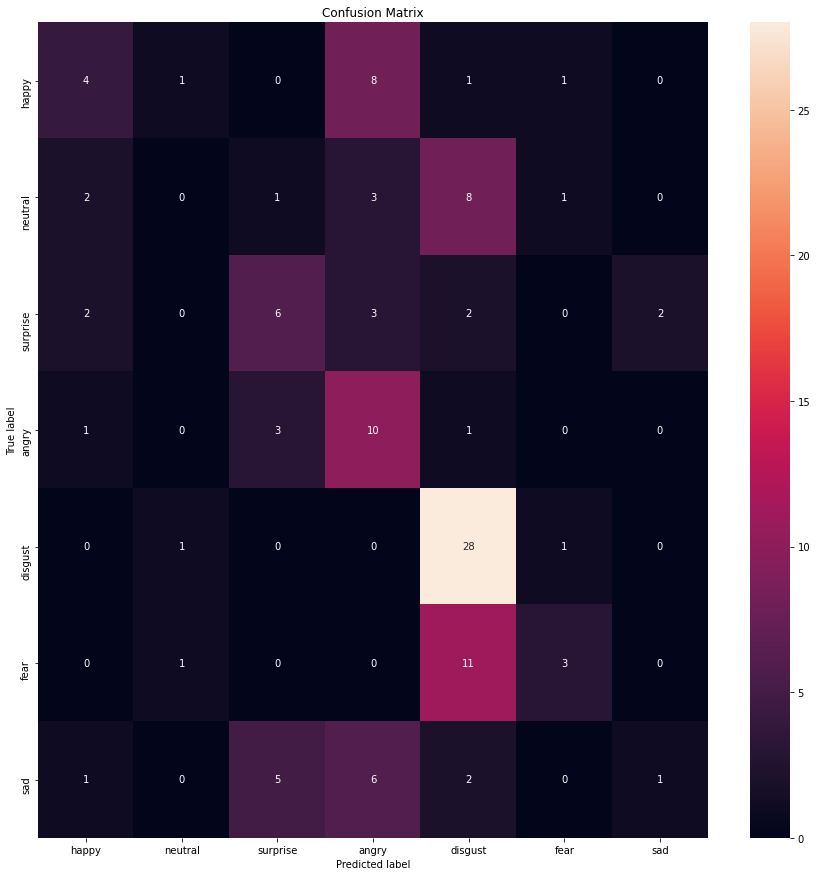

In [ ]:
speaker_dependent_analysis(X_train_s, y_train_s, X_test_s, y_test_s)

For SAVEE dataset, it appears that the validation metrics (accuracy, weighted f1-score) and the test ones are similar. Probably due to small sample size, the classifier cannot generalize properly.

Validation Accuracy:  0.9714285714285714
Validation F1 Score:  0.9718660239201761
Test Accuracy:  0.48283261802575106
Test F1 Score:  0.4898912170670342


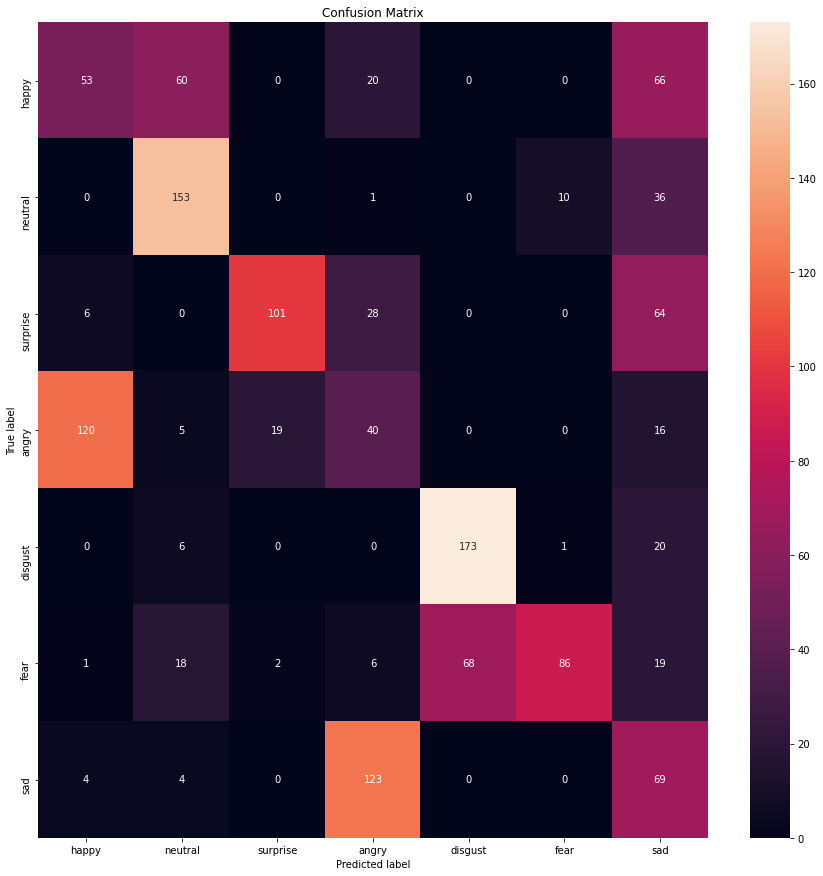

In [ ]:
speaker_dependent_analysis(X_train_t, y_train_t, X_test_t, y_test_t)

In TESS dataset, the overfitting consequences are significant, due to the fact that both train and validation sets contain audio samples only from one speaker.

### Speaker independent analysis
---
In this section, we test the performance of the Support Vector Classifier, over predicting the correct class on the speakers that belong to the test set at SAVEE and TESS datasets, respectively. 

In [ ]:
def speaker_independent_analysis(X_train, y_train, X_test, y_test):

  svm_clf = SVC(random_state=42)
  svm_clf.fit(X_train,y_train)

  pred = svm_clf.predict(X_test)
  accuracy = accuracy_score(y_test, pred)
  print('Test Accuracy: ',accuracy)
  f1 = f1_score(y_test, pred, average='weighted')
  print('Test F1 Score: ', f1)

  plot_cm(y_test, pred)

Test Accuracy:  0.4666666666666667
Test F1 Score:  0.42441171697500807


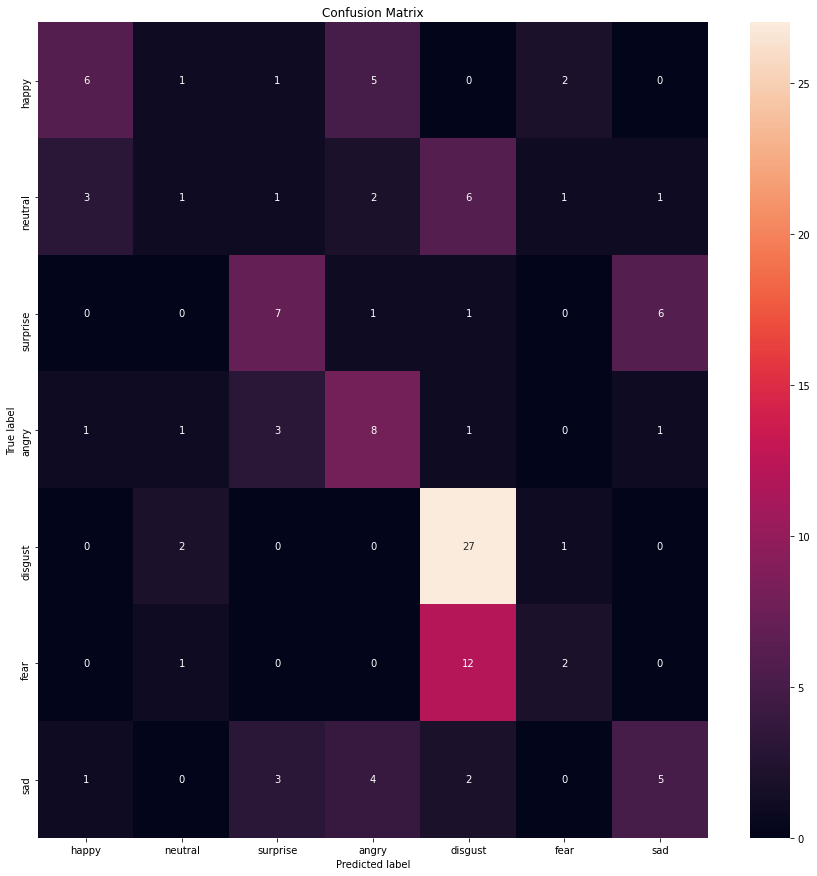

In [ ]:
speaker_independent_analysis(X_train_s, y_train_s, X_test_s, y_test_s)

Accuracy score and F1 score are slightly better than those achieved at the speaker depended analysis. This makes sense, since more training examples are fed to the classifier in this approach.

Test Accuracy:  0.4899856938483548
Test F1 Score:  0.49789701851976587


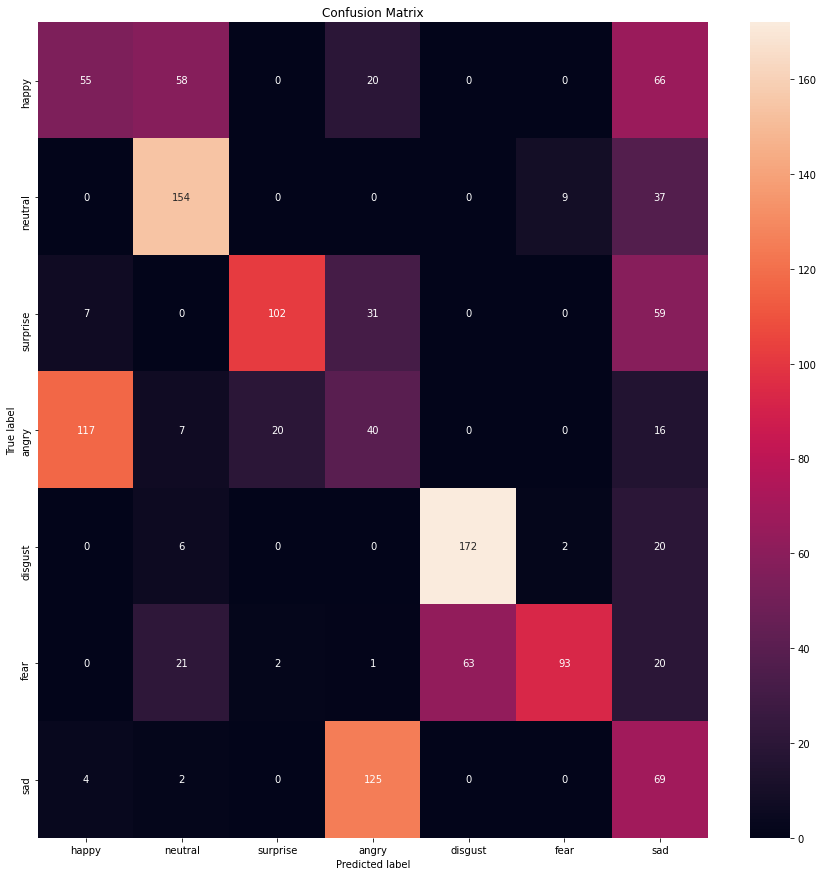

In [ ]:
speaker_independent_analysis(X_train_t, y_train_t, X_test_t, y_test_t)

Similar test set scores to the speaker dependent analysis are achieved at the speaker independent analysis. As long as this dataset is larger than SAVEE, the split that took place during the speaker dependent analysis does not affect the classifier performance significantly.

### Hyperparameter tuning
---
The purpose of the hyperparameter tuning is to select the best parameter combination for the classifier, in order to achieve better scores at the selecter metrics and hence, better classification results.

The chosen hyperparameters were the C parameter (regularization parameter) and the decision function shape. The tuning was performed at the accuracy score metric.

In [ ]:
def hyperparameter_tuning(X_train, y_train, X_test, y_test, classifier):
    """Tune the selected classifier's hypeparameters"""    
    default_model = classifier
    default_model.fit(X_train,y_train)
    prediction = default_model.predict(X_test)
    
    hyperparameters = {"C": [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
                       "decision_function_shape":['ovo', 'ovr']}

    scorer = make_scorer(accuracy_score)
    grid_search = GridSearchCV(classifier,hyperparameters,scorer,n_jobs=-1)
    grid_fit = grid_search.fit(X_train,y_train)
    best_model = grid_fit.best_estimator_    
    best_prediction = best_model.predict(X_test)
    
    print('Unoptimized Model\nAccuracy: {}\nF1 Score: {}'.format(accuracy_score(y_test,prediction),
                                                                 f1_score(y_test,prediction, average='weighted')))
    print('Hyperparameters: C: {}, Decision function shape: {}\n'.format(default_model.C, default_model.decision_function_shape))
    print('Best Model\nAccuracy: {}\nF1 Score: {}'.format(accuracy_score(y_test,best_prediction),
                                                                 f1_score(y_test,best_prediction, average='weighted')))
    print('Hyperparameters: C: {}, Decision function shape: {}\n'.format(best_model.C,best_model.decision_function_shape))

    print('---------------------------------------------------------------------------------')
    
    return best_model

In [ ]:
best_clf_s = hyperparameter_tuning(X_train_s, y_train_s, X_test_s, y_test_s, SVC())

Unoptimized Model
Accuracy: 0.4666666666666667
F1 Score: 0.42441171697500807
Hyperparameters: C: 1.0, Decision function shape: ovr

Best Model
Accuracy: 0.4166666666666667
F1 Score: 0.40178095857443685
Hyperparameters: C: 10.0, Decision function shape: ovo

---------------------------------------------------------------------------------


It appears that the tuned model overfit the train set, hence the scores at the test set are worse that those returned by the unoptimized model. 

In [ ]:
best_clf_t = hyperparameter_tuning(X_train_t, y_train_t, X_test_t, y_test_t, SVC())

Unoptimized Model
Accuracy: 0.4899856938483548
F1 Score: 0.49789701851976587
Hyperparameters: C: 1.0, Decision function shape: ovr

Best Model
Accuracy: 0.5028612303290415
F1 Score: 0.5067867142409216
Hyperparameters: C: 10.0, Decision function shape: ovo

---------------------------------------------------------------------------------


The tuning that took place for the TESS train data seems that it slightly improved the metric scores.

### Feature Histograms
---
In this section, we plot the histograms of each extracted feature to check their variation among the different classes.

In [ ]:
def plot_feature_histograms(list_of_feature_mtr, feature_names,
                            class_names, n_columns=5):
    '''
    Plots the histograms of all classes and features for a given
    classification task.
    :param list_of_feature_mtr: list of feature matrices
                                (n_samples x n_features) for each class
    :param feature_names:       list of feature names
    :param class_names:         list of class names, for each feature matr
    '''
    n_features = len(feature_names)
    n_bins = 12
    n_rows = int(n_features / n_columns) + 1
    figs = plotly.tools.make_subplots(rows=n_rows, cols=n_columns,
                                      subplot_titles=feature_names)
    figs['layout'].update(height=(n_rows * 250))
    clr = get_color_combinations(len(class_names))
    for i in range(n_features):
        # for each feature get its bin range (min:(max-min)/n_bins:max)
        f = np.vstack([x[:, i:i + 1] for x in list_of_feature_mtr])
        bins = np.arange(f.min(), f.max(), (f.max() - f.min()) / n_bins)
        for fi, f in enumerate(list_of_feature_mtr):
            # load the color for the current class (fi)
            mark_prop = dict(color=clr[fi], line=dict(color=clr[fi], width=3))
            # compute the histogram of the current feature (i) and normalize:
            h, _ = np.histogram(f[:, i], bins=bins)
            h = h.astype(float) / h.sum()
            cbins = (bins[0:-1] + bins[1:]) / 2
            scatter_1 = go.Scatter(x=cbins, y=h, name=class_names[fi],
                                   marker=mark_prop, showlegend=(i == 0))
            # (show the legend only on the first line)
            figs.append_trace(scatter_1, int(i/n_columns)+1, i % n_columns+1)
    for i in figs['layout']['annotations']:
        i['font'] = dict(size=10, color='#224488')
    plotly.offline.plot(figs, filename="report.html", auto_open=True)

In [ ]:
def get_color_combinations(n_classes):
    clr_map = plt.cm.get_cmap('jet')
    range_cl = range(0, 255, int(255/n_classes))
    clr = []
    for i in range(n_classes):
        clr.append('rgba({},{},{},{})'.format(clr_map(range_cl[i])[0],
                                              clr_map(range_cl[i])[np.random.randint(4)],
                                              clr_map(range_cl[i])[np.random.randint(4)],
                                              clr_map(range_cl[i])[3]))
    return clr

In [ ]:
plot_feature_histograms(fs, fn_s, class_names)
IPython.display.HTML(filename='./report.html')

/usr/local/lib/python3.7/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [ ]:
plot_feature_histograms(ft, fn_t, class_names)
IPython.display.HTML(filename='./report.html')

/usr/local/lib/python3.7/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



From the histogram plots we observe that some features like mfcc mean and mfcc std have significant variation among the classes. However, other features like the energy entropy mean and the delta chroma mean have almost identical values at all classes.

### Feature Selection
---
The feature histogram results indicate that a feature selection procedure would provide better classification performance.

As feature selection method, we choose the Variance Threshold one, to remove features with variance below the specified threshold.

In [ ]:
def feature_selection(X_train, y_train, X_test, y_test, threshold=1):
  """
  Removes features with variance 
  lower than the specified threshold
  """
  selector = VarianceThreshold(threshold)

  X_train_f = selector.fit_transform(X_train)
  X_test_f = selector.transform(X_test)

  print('Initial features: {}\nRemaining features: {}'.format(X_train.shape[1], X_train_f.shape[1]))
  speaker_independent_analysis(X_train_f, y_train, X_test_f, y_test)

Initial features: 138
Remaining features: 73
Test Accuracy:  0.5
Test F1 Score:  0.4760206613914178


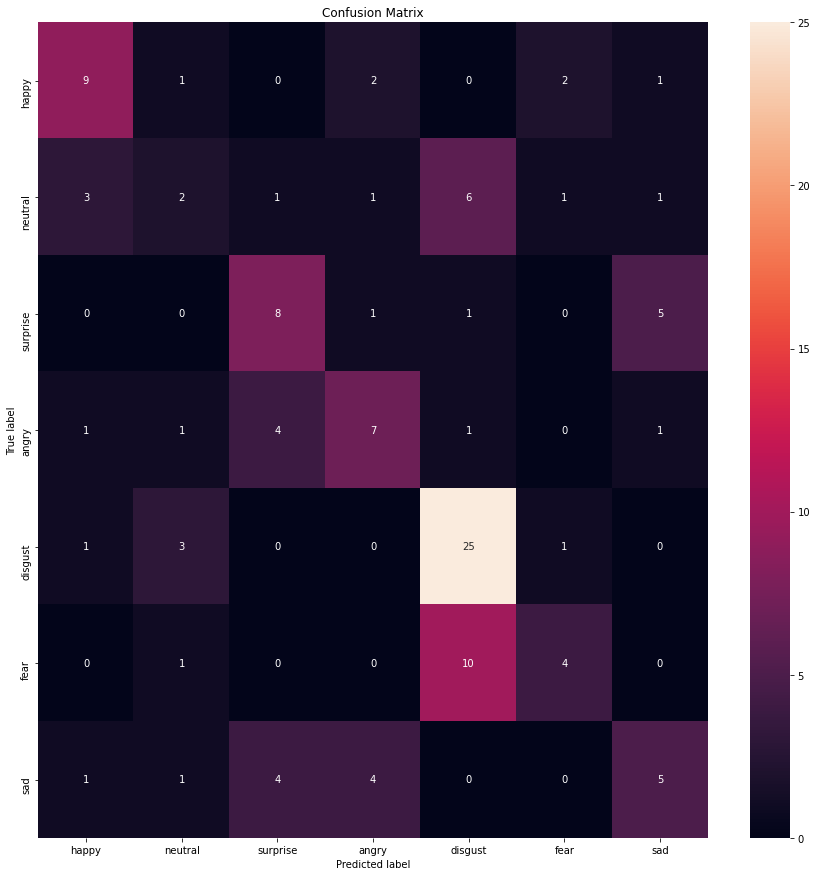

In [ ]:
feature_selection(X_train_s, y_train_s, X_test_s, y_test_s)

As it is observed, there is a slight improvement in accuracy and f1 score at the SAVEE dataset.

Initial features: 138
Remaining features: 64
Test Accuracy:  0.43776824034334766
Test F1 Score:  0.4511318218770213


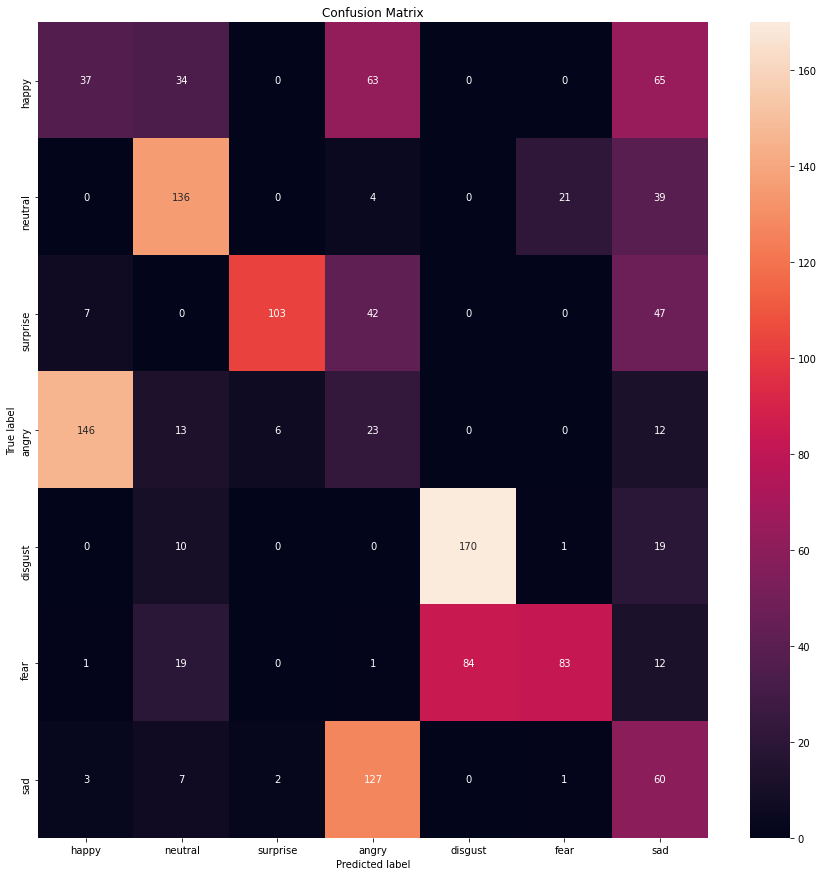

In [ ]:
feature_selection(X_train_t, y_train_t, X_test_t, y_test_t)

### Simplifing problem - Reduce classes
---
In this section, we simplify the problem by reducing the number of classes to 3 (happy, angry, sad) to check the classification results over three emotions with significant differences.

In [ ]:
class_names = ['happy', 'angry', 'sad']

In [ ]:
X_train_si, X_test_si, y_train_si, y_test_si, fs, fn_s = extract_midterm_features('./train_data_savee', './test_data_savee', simplified=True)

Analyzing file 1 of 45: ./train_data_savee/angry/DC_a01.wav
Analyzing file 2 of 45: ./train_data_savee/angry/DC_a02.wav
Analyzing file 3 of 45: ./train_data_savee/angry/DC_a03.wav
Analyzing file 4 of 45: ./train_data_savee/angry/DC_a04.wav
Analyzing file 5 of 45: ./train_data_savee/angry/DC_a05.wav
Analyzing file 6 of 45: ./train_data_savee/angry/DC_a06.wav
Analyzing file 7 of 45: ./train_data_savee/angry/DC_a07.wav
Analyzing file 8 of 45: ./train_data_savee/angry/DC_a08.wav
Analyzing file 9 of 45: ./train_data_savee/angry/DC_a09.wav
Analyzing file 10 of 45: ./train_data_savee/angry/DC_a10.wav
Analyzing file 11 of 45: ./train_data_savee/angry/DC_a11.wav
Analyzing file 12 of 45: ./train_data_savee/angry/DC_a12.wav
Analyzing file 13 of 45: ./train_data_savee/angry/DC_a13.wav
Analyzing file 14 of 45: ./train_data_savee/angry/DC_a14.wav
Analyzing file 15 of 45: ./train_data_savee/angry/DC_a15.wav
Analyzing file 16 of 45: ./train_data_savee/angry/JE_a01.wav
Analyzing file 17 of 45: ./train_

Test Accuracy:  0.6888888888888889
Test F1 Score:  0.6819304152637485


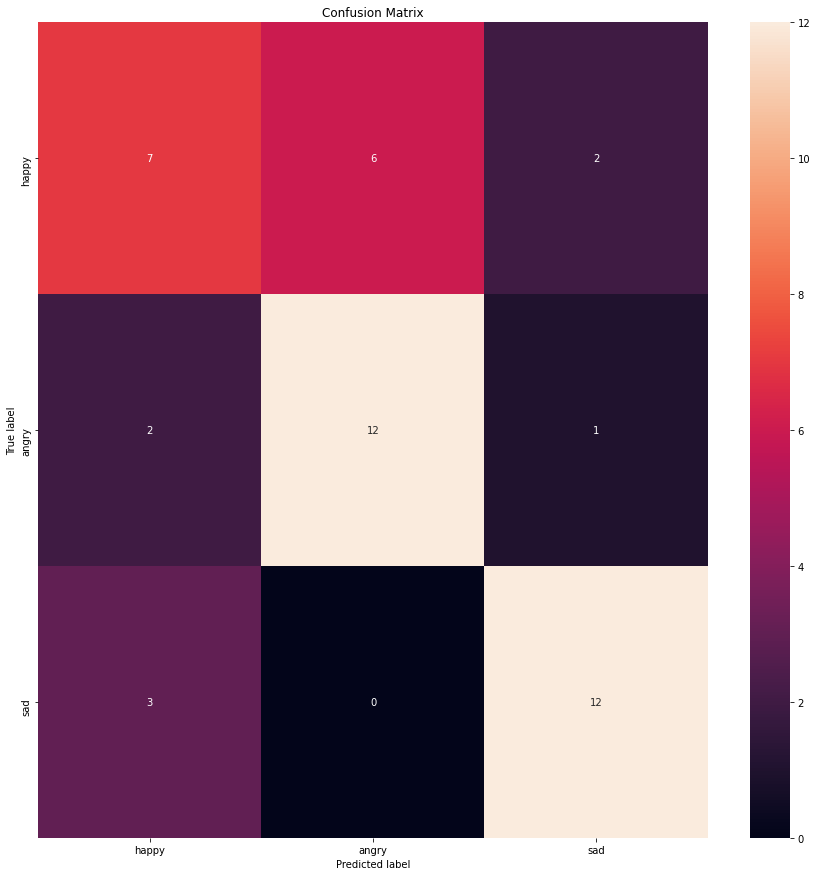

In [ ]:
speaker_independent_analysis(X_train_si, y_train_si, X_test_si, y_test_si)

In [ ]:
X_train_ti, X_test_ti, y_train_ti, y_test_ti, fs, fn_s = extract_midterm_features('./train_data_tess', './test_data_tess', simplified=True)

Analyzing file 1 of 200: ./train_data_tess/angry/OAF_back_angry.wav
Analyzing file 2 of 200: ./train_data_tess/angry/OAF_bar_angry.wav
Analyzing file 3 of 200: ./train_data_tess/angry/OAF_base_angry.wav
Analyzing file 4 of 200: ./train_data_tess/angry/OAF_bath_angry.wav
Analyzing file 5 of 200: ./train_data_tess/angry/OAF_bean_angry.wav
Analyzing file 6 of 200: ./train_data_tess/angry/OAF_beg_angry.wav
Analyzing file 7 of 200: ./train_data_tess/angry/OAF_bite_angry.wav
Analyzing file 8 of 200: ./train_data_tess/angry/OAF_boat_angry.wav
Analyzing file 9 of 200: ./train_data_tess/angry/OAF_bone_angry.wav
Analyzing file 10 of 200: ./train_data_tess/angry/OAF_book_angry.wav
Analyzing file 11 of 200: ./train_data_tess/angry/OAF_bought_angry.wav
Analyzing file 12 of 200: ./train_data_tess/angry/OAF_burn_angry.wav
Analyzing file 13 of 200: ./train_data_tess/angry/OAF_cab_angry.wav
Analyzing file 14 of 200: ./train_data_tess/angry/OAF_calm_angry.wav
Analyzing file 15 of 200: ./train_data_tess/

Test Accuracy:  0.5141903171953256
Test F1 Score:  0.5196771964525523


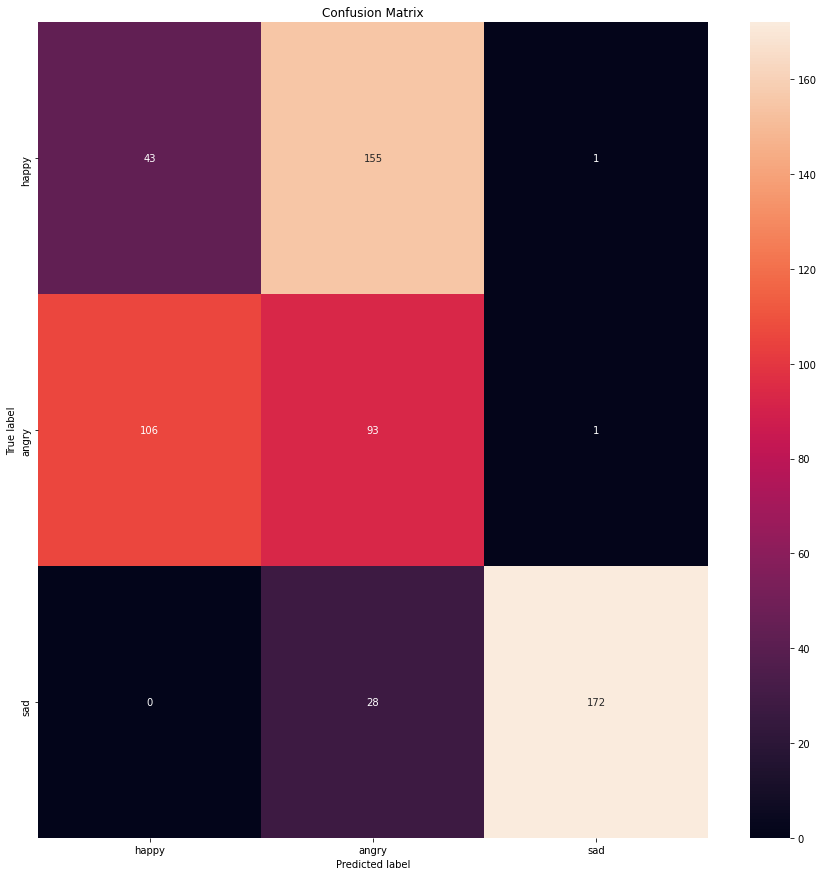

In [ ]:
speaker_independent_analysis(X_train_ti, y_train_ti, X_test_ti, y_test_ti)

Classification results were better at the simplified 3 class problem on both datasets, since those 3 emotions are more easily distinguished.

### Investigate dataset bias
---

The performance of a classifier trained on certain dataset against data from another dataset is investigated in this section.

In [ ]:
class_names = ['happy', 'neutral', 'surprise', 'angry', 'disgust', 'fear', 'sad']

Test Accuracy:  0.27968526466380544
Test F1 Score:  0.294783568995891


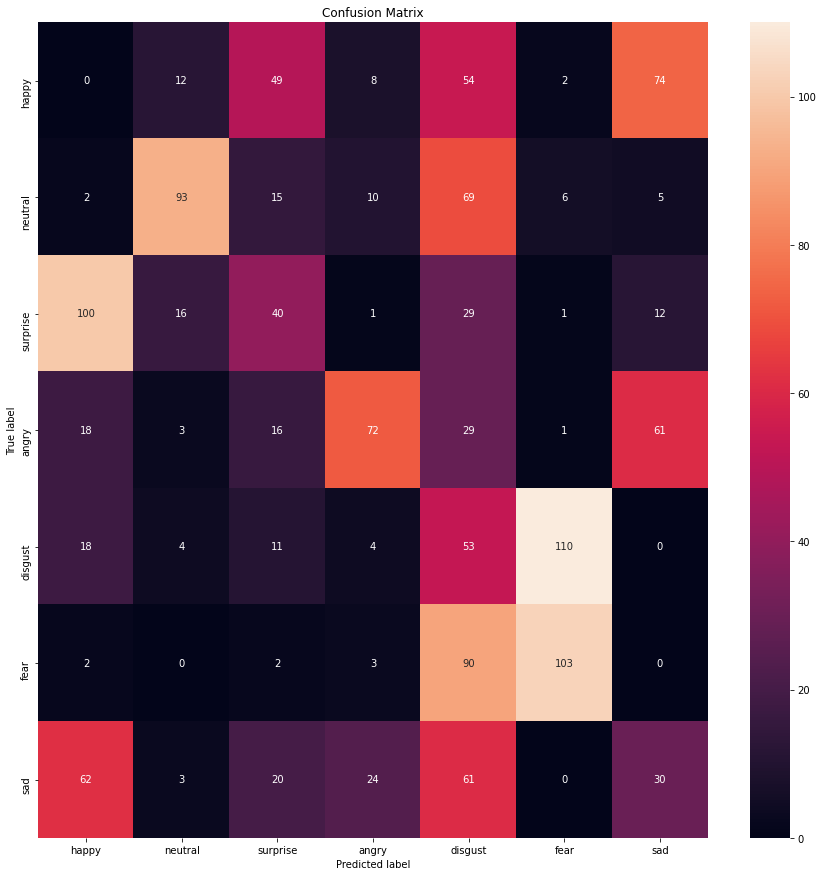

In [ ]:
speaker_independent_analysis(X_train_s, y_train_s, X_test_t, y_test_t)

Test Accuracy:  0.19166666666666668
Test F1 Score:  0.16619719395621338


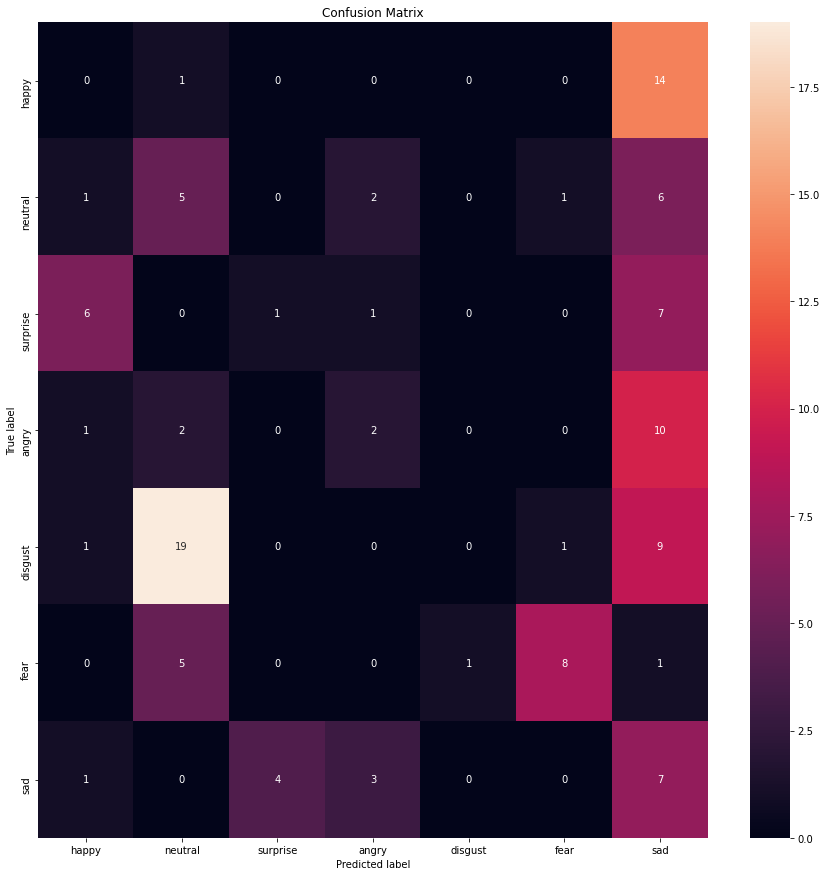

In [ ]:
speaker_independent_analysis(X_train_t, y_train_t, X_test_s, y_test_s)

Results indicate dataset bias are extracted from the analysis. Performance of the classifiers trained on SAVEE and TESS significally drops when the first is checked at the test set of the latter and vice versa.

### Deep learning approach
---
The approach utilizes the [deep_audio_features](https://github.com/tyiannak/deep_audio_features) library to classify the emotions via training a CNN with the respective Mel Spectograms of the audio files as input.

In [ ]:
import sys
import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import torch.nn as nn
import glob2 as glob
from sklearn.model_selection import StratifiedShuffleSplit
import math
from copy import deepcopy
import wave
import contextlib
from tqdm import tqdm
from PIL import Image
import time
import datetime
import librosa

In [ ]:
# Configuration parameters for audio feature model
# Training
EPOCHS = 500
CNN_BOOLEAN = True

# .pkl files
VARIABLES_FOLDER = "./"
# Sampling settings
WINDOW_LENGTH = (50 * 1e-3)
HOP_LENGTH = (50 * 1e-3)

# Dataloader
BATCH_SIZE = 16
OVERSAMPLING = False
FEATURE_EXTRACTION_METHOD = "MEL_SPECTROGRAM"
FUSED_SPECT = False
ZERO_PAD = True
FORCE_SIZE = False
SPECTOGRAM_SIZE = (51, 128)

In [ ]:
class CNN1(nn.Module):
    def __init__(self, height, width, output_dim=7, first_channels=32,
                 kernel_size=5, stride=1, padding=2, zero_pad=False, spec_size=SPECTOGRAM_SIZE,
                 fuse=False, type='classifier'):
        super(CNN1, self).__init__()
        self.zero_pad = zero_pad
        self.spec_size = spec_size
        self.fuse = fuse
        self.type = type
        self.num_cnn_layers = 4
        self.cnn_channels = 2
        self.height = height
        self.width = width
        self.first_channels = first_channels
        self.kernel_size = kernel_size
        self.stride = stride

        self.conv_layer1 = nn.Sequential(
            nn.Conv2d(1, first_channels, kernel_size=5,
                      stride=stride, padding=padding),
            nn.BatchNorm2d(first_channels),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=2))
        if type == 'classifier':

            self.conv_layer2 = nn.Sequential(
                nn.Conv2d(first_channels, self.cnn_channels*first_channels,
                          kernel_size=5, stride=stride, padding=padding),
                nn.BatchNorm2d(self.cnn_channels*first_channels),
                nn.LeakyReLU(),
                nn.MaxPool2d(kernel_size=2)
            )
            self.conv_layer3 = nn.Sequential(
                nn.Conv2d(self.cnn_channels * first_channels, (self.cnn_channels ** 2) * first_channels,
                          kernel_size=5, stride=stride, padding=padding),
                nn.BatchNorm2d((self.cnn_channels ** 2) * first_channels),
                nn.LeakyReLU(),
                nn.MaxPool2d(kernel_size=2)
            )

            self.conv_layer4 = nn.Sequential(
                nn.Conv2d((self.cnn_channels**2)*first_channels, (self.cnn_channels**3) * first_channels,
                          kernel_size=5, stride=stride, padding=padding),
                nn.BatchNorm2d((self.cnn_channels ** 3) * first_channels),
                nn.LeakyReLU(),
                nn.MaxPool2d(kernel_size=2)
            )
            self.linear_layer1 = nn.Sequential(
                nn.Dropout(0.75),
                nn.Linear(self.calc_out_size(), 1024),
                nn.LeakyReLU()
            )

            self.linear_layer2 = nn.Sequential(
                nn.Dropout(0.5),
                nn.Linear(1024, 256),
                nn.LeakyReLU()
            )
            self.linear_layer3 = nn.Sequential(
                # nn.Dropout(0.2),
                nn.Linear(256, output_dim),
                nn.LeakyReLU()
            )

    def forward(self, x):
        # input: (batch_size,1,max_seq,features)
        # Each layer applies the following matrix tranformation
        # recursively: (batch_size,conv_output,max_seq/2 -1,features/2 -1)
        # CNN
        out = self.conv_layer1(x)
        if self.type == 'classifier':
            out = self.conv_layer2(out)

            out = self.conv_layer3(out)
            out = self.conv_layer4(out)
            out = out.view(out.size(0), -1)

            # DNN -- pass through linear layers
            out = self.linear_layer1(out)
            out = self.linear_layer2(out)
            out = self.linear_layer3(out)
        else:
            out = out.view(out.size(0), -1)

        return out

    def calc_out_size(self):
        height = int(self.height / 16)
        width = int(self.width / 16)
        kernels = (self.cnn_channels ** (self.num_cnn_layers - 1)) *\
            self.first_channels
        return kernels * height * width

In [ ]:
def load(folders=None, test_val=[0.2, 0.2], test=True, validation=True):
    """Loads a dataset from some folders.
    Arguments
    ----------
        folders {list} : A list of folders containing all samples.
        test_val {list} : A list containing the percentages for test and validation split.
        test {boolean} : If False only train samples and labels are returned.
        validation {boolean} : If False only train and test samples and
        labels are returned.
    Returns
    --------
        X_train {list} : All filenames for train.
        y_train {list} : Labels for train.
        X_test {list} : Filenames for test.
        y_test {list} : Labels for train.
        if `validation` is `True` also returns the following:
        X_valid {list} : Filenames for validation.
        y_valid {list} : Labels for validation.
    """
    if folders is None:
        raise AssertionError()
    filenames = []
    labels = []

    # Match filenames with labels
    for folder in folders:
        for f in glob.iglob(os.path.join(folder, '*.wav')):
            filenames.append(f)
            labels.append(folder)

    # Convert labels to int
    folder2idx, idx2folder = folders_mapping(folders=folders)
    labels = list(map(lambda x: folder2idx[x], labels))

    print('Folder to index dict:\n', folder2idx)

    # Split
    if test is False and validation is False:
        # Use this data only to train
        return filenames, labels

    # Get percentages
    test_p, val_p = test_val

    X_train_, y_train_ = [], []
    X_test, y_test = [], []
    X_train, y_train = [], []
    X_val, y_val = [], []
    # First split
    sss = StratifiedShuffleSplit(n_splits=1, test_size=test_p, random_state=0)
    train_idx, test_idx = next(
        sss.split(filenames, labels))
    # Train
    for idx in train_idx:
        X_train_.append(filenames[idx])
        y_train_.append(labels[idx])
    # Test
    for idx in test_idx:
        X_test.append(filenames[idx])
        y_test.append(labels[idx])

    # If validation split is not needed return
    if validation is False:
        return X_train_, y_train_, X_test, y_test

    # If valuation is True split again
    sss = StratifiedShuffleSplit(n_splits=1, test_size=val_p, random_state=0)
    train_idx, val_idx = next(sss.split(X_train_, y_train_))
    # Train after both splits
    for idx in train_idx:
        X_train.append(X_train_[idx])
        y_train.append(y_train_[idx])
    # validation
    for idx in val_idx:
        X_val.append(X_train_[idx])
        y_val.append(y_train_[idx])

    return X_train, y_train, X_test, y_test, X_val, y_val


def compute_max_seq_len(reload=False, X=None, folders=None):
    """Return max sequence length for all files."""
    # TAKE THE WINDOW STEPS
    if reload is True:
        if folders is None:
            raise AssertionError()
        # Get all sample labels
        X_train, _, X_test, _, X_val, _ = load(folders=folders)
        X = X_train+X_test+X_val
    # DEFAULT
    else:
        if X is None:
            raise AssertionError()

    # Calculate and print max sequence number
    print(HOP_LENGTH, WINDOW_LENGTH)
    lengths = []
    for f in X:
        with contextlib.closing(wave.open(f, 'r')) as fp:
            frames = fp.getnframes()
            fs = fp.getframerate()
            duration = frames / float(fs)
            length = int((duration -
                          (WINDOW_LENGTH - HOP_LENGTH)) / \
                         (HOP_LENGTH) + 1)
            lengths.append(length)
    max_seq = np.max(lengths)
    print(f"Max sequence length in dataset: {max_seq}")
    return max_seq


def folders_mapping(folders):
    """Return a mapping from folder to class and a mapping from class to folder."""
    folder2idx = {}
    idx2folder = {}
    for idx, folder in enumerate(folders):
        folder2idx[folder] = idx
        idx2folder[idx] = folder
    return folder2idx, idx2folder

In [ ]:
folder2idx, idx2folder = folders_mapping(os.listdir('./train_data_savee'))
idx2folder

{0: 'surprise',
 1: 'sad',
 2: 'fear',
 3: 'neutral',
 4: 'happy',
 5: 'disgust',
 6: 'angry'}

In [ ]:
def train_and_validate(model,
                       train_loader,
                       valid_loader,
                       loss_function,
                       optimizer,
                       epochs,
                       cnn=False,
                       validation_epochs=5,
                       early_stopping=False,
                       patience=10):
    """
    Trains the given <model>.
    Then validates every <validation_epochs>.
    Returns: <best_model> containing the model with best parameters.
    """

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', verbose=True)

    # obtain the model's device ID
    device = next(model.parameters()).device

    print(next(iter(train_loader)))

    EPOCHS = epochs
    VALIDATION_EPOCHS = validation_epochs

    # Store losses, models
    all_accuracy_training = []
    all_accuracy_validation = []
    all_train_loss = []
    all_valid_loss = []
    all_valid_f1 = []
    best_model = None
    best_model_epoch = 0
    min_loss = 1000
    f1_max = 0
    early_stop_counter = 0

    # Iterate for EPOCHS
    for epoch in range(1, EPOCHS + 1):

        scheduler.step(epoch)
        # ===== Training HERE =====
        train_loss, train_acc = train(epoch, train_loader, model,
                                      loss_function, optimizer, cnn=cnn)
        # Store statistics for later usage
        all_train_loss.append(train_loss)
        all_accuracy_training.append(train_acc)

        # ====== VALIDATION HERE ======

        valid_loss, valid_acc, valid_f1 = validate(epoch, valid_loader,
                                         model, loss_function,
                                         validation_epochs, cnn=cnn)

        # Find best model
        if best_model is None:
            # Initialize
            # Store model but on cpu
            best_model = deepcopy(model).to('cpu')
            best_model_epoch = epoch
            # Save new minimum
            f1_max = valid_f1
        # New model with lower loss
        elif valid_f1 > f1_max + 1e-5:
            # Update loss
            f1_max = valid_f1
            # Update best model, store on cpu
            best_model = deepcopy(model).to('cpu')
            best_model_epoch = epoch
            early_stop_counter = 0
        else:
            early_stop_counter += 1

        # Store statistics for later usage
        all_valid_loss.append(valid_loss)
        all_accuracy_validation.append(valid_acc)
        all_valid_f1.append(valid_f1)
        # Make sure enough epochs have passed
        if epoch < 4 * VALIDATION_EPOCHS:
            continue

        # Early stopping enabled?
        if early_stopping is False:
            continue
        # If enabled do everything needed
        STOP = True

        # If validation loss is ascending two times in a row exit training
        if early_stop_counter > patience:
            print(f'\nIncreasing loss..')
            print(f'\nResetting model to epoch {best_model_epoch}.')
            # Remove unnessesary model
            model.to('cpu')
            best_model = best_model.to(device)
            # Exit 2 loops at the same time, go to testing
            return best_model, all_train_loss, all_valid_loss, \
                   all_accuracy_training, all_accuracy_validation,\
                   all_valid_f1, epoch

        # Small change in loss
        """
        if (abs(all_valid_loss[-1] - all_valid_loss[-2]) < 1e-3 and
                abs(all_valid_loss[-2] - all_valid_loss[-3]) < 1e-3):
            print(f'\nVery small change in loss..')
            print(f'\nResetting model to epoch {best_model_epoch}.')
            # Remove unnecessary model
            model.to('cpu')
            best_model = best_model.to(device)
            # Exit 2 loops at the same time, go to testing
            return best_model, all_train_loss, all_valid_loss, \
                   all_accuracy_training, all_accuracy_validation, epoch
        """
    print(f'\nTraining exited normally at epoch {epoch}.')
    # Remove unnecessary model
    model.to('cpu')
    best_model = best_model.to(device)
    return best_model, all_train_loss, all_valid_loss, \
           all_accuracy_training, all_accuracy_validation,\
           all_valid_f1, epoch

In [ ]:
def load_wav(filename):
    """Rea audio file and return audio signal and sampling frequency"""
    if not os.path.exists(filename):
        raise FileNotFoundError
    # Load file using librosa
    x, fs = librosa.load(filename, sr=None)
    return x, fs


def get_mfcc(x, fs):
    """Return MFCC of a given file, opened using librosa library."""
    return librosa.feature.mfcc(x, fs, n_mfcc=13,
                                win_length=int(WINDOW_LENGTH * fs),
                                hop_length=int(HOP_LENGTH * fs))


def get_mfcc_with_deltas(wav, fs):
    """Return MFCC, delta and delta-delta of a given wav."""
    mfcc = get_mfcc(wav, fs)
    mfcc_delta = librosa.feature.delta(mfcc, order=1)
    mfcc_delta_delta = librosa.feature.delta(mfcc, order=2)
    return np.concatenate((mfcc, mfcc_delta, mfcc_delta_delta))

def get_melspectrogram(x=None, fs=None, n_fft=None, hop_length=None, fuse=False):
    """Returns a mel spectrogram."""

    if x is None:
        return None
    # Set some values
    if n_fft is None:
        n_fft = int(WINDOW_LENGTH * fs)
    if hop_length is None:
        hop_length = int(HOP_LENGTH * fs)
    # Get spectrogram
    spectrogram = librosa.feature.melspectrogram(y=x, sr=fs, n_fft=n_fft,
                                                 hop_length=hop_length)
    # Convert to MEL-Scale
    spectrogram_dB = librosa.power_to_db(spectrogram, ref=np.max)  # (n_mel,t)

    if fuse:
        chroma = librosa.feature.chroma_stft(y=x, sr=fs, n_fft=n_fft,
                                             hop_length=hop_length)
        chroma_dB = librosa.power_to_db(chroma, ref=np.max)
        out = np.concatenate((spectrogram_dB.T, chroma_dB.T), axis=1)
    else:
        # Transpose to return (time,n_mel)
        out = spectrogram_dB.T
    return out


def preview_melspectrogram(spectrogram=None, filename='spectrogram.png'):
    """Save a given spectrogram as an image."""

    if spectrogram is None:
        raise AssertionError

    import matplotlib.pyplot as plt
    import librosa.display

    plt.figure(figsize=(10, 4))
    # Spectrogram already in mel scale
    librosa.display.specshow(spectrogram)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-frequency spectrogram')
    plt.tight_layout()
    plt.savefig(filename)
    return plt

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

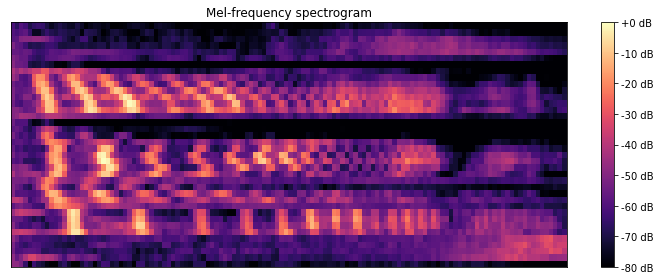

In [ ]:
signal, fs = load_wav('./TESS/YAF_happy/YAF_boat_happy.wav')
feature = get_melspectrogram(signal, fs=fs)
preview_melspectrogram(feature)

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

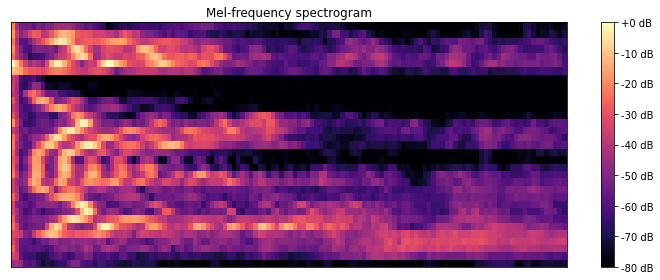

In [ ]:
signal, fs = load_wav('./TESS/OAF_happy/OAF_boat_happy.wav')
feature = get_melspectrogram(signal, fs=fs)
preview_melspectrogram(feature)

In [ ]:
class FeatureExtractorDataset(Dataset):
    """Custom PyTorch Dataset for preparing features from wav inputs."""

    def __init__(self, X, y, fe_method="MFCC",
                 oversampling=False, max_sequence_length=281,
                 zero_pad=False, forced_size=None, pure_features=False,
                 fuse=False, show_hist=True, test_segmentation=False):
        """Create all important variables for dataset tokenization
        Arguments:
        ----------
            X {list} : List of training samples.
            y {list} : List of training labels.
            fe_method {string} : The method that extracts the features.
            oversampling {bool} : Resampling technique to be applied.
            max_sequence_length {int} : Max sequence length of the set.
            zero_pad {bool}: Apply zero padding (True) or resizing (False)
            forced_size {bool}: Force specific size when resizing
            pure_features {bool}: Keep pure features (neither zero
            padding nor resizing)
            fuse {bool}: Fuse spectrogram with chromagram or not
            show_hist {bool}: Whether to store a histogram of the files'
                sequence length
            test_segmentation {bool}: Whether to extract segment predictions
                of a large sequence. Applied only for 1-file testing for the
                time being.
        """
        self.fe_method = fe_method
        self.max_sequence_length = max_sequence_length
        self.fuse = fuse
        if fuse:
            print('--> Fusing spectrogram and chromagram')

        if oversampling is True:
            ros = RandomOverSampler()
            # Expand last dimension
            X, y = ros.fit_resample(np.reshape(X, (len(X), -1)), y)
            # Reshape again for use
            X = np.squeeze(X)

        # Depending on the extraction method get X

        features = []
        fss = []
        print("--> Extracting spectrogram associated features. . .")
        spec_sizes = []
        for audio_file in tqdm(X):  # for each audio file
            # load the signal
            signal, fs = load_wav(audio_file)
            # get the features:
            if fe_method == "MEL_SPECTROGRAM":
                feature = get_melspectrogram(signal, fs=fs, fuse=fuse)
            else:
                feature = get_mfcc_with_deltas(signal, fs=fs, fuse=fuse)

            spec_sizes.append(feature.shape[0])

            # append to list of features
            features.append(feature)
            fss.append(fs)
        self.features = features

        spec_sizes = np.asarray(spec_sizes)

        if test_segmentation:
            # NOTE: Applied only to 1 file input
            print("--> Applying segmentation to the input file. . .")
            sequence = features[0]
            sequence_length = spec_sizes[0]
            segment_length = forced_size[0]
            progress = 0
            segments = []
            while progress < sequence_length:
                if progress + segment_length > sequence_length:
                    segments.append(sequence[progress:-1])
                else:
                    segments.append(sequence[progress: progress + segment_length + 1])

                progress = progress + segment_length

            print(len(segments))
            self.features = segments
            self.spec_size = forced_size

            self.y = torch.tensor(np.zeros(len(segments)), dtype=int)
            lengths = np.array([len(x) for x in segments])
            self.lengths = torch.tensor(lengths)

        else:
            if show_hist:
                self.plot_hist(spec_sizes, y)

            if forced_size is None:
                size_0 = int(np.mean(spec_sizes))
                size_1 = 140 if fuse else 128
                self.spec_size = (size_0, size_1)
            else:
                self.spec_size = forced_size
            # Create tensor for labels
            self.y = torch.tensor(y, dtype=int)
            # Get all lengths before zero padding
            lengths = np.array([len(x) for x in X])
            self.lengths = torch.tensor(lengths)

        if not pure_features:
            self.handle_lengths(zero_pad)

    def __len__(self):
        """Returns length of FeatureExtractor dataset."""
        return len(self.X)

    def __getitem__(self, index):
        """Returns a _transformed_ item from the dataset
        Arguments:
            index {int} -- [Index of an element to be returned]
        Returns:
            (tuple)
                * sample [ndarray] -- [Features of an sample]
                * label [int] -- [Label of an sample]
                * len [int] -- [Original length of sample]
        """
        return self.X[index], self.y[index], self.lengths[index]

    def handle_lengths(self, zero_pad=False, size=None):

        if size is not None:
            spec_size = size
        else:
            spec_size = self.spec_size

        if zero_pad:
            X = self.zero_pad_and_stack()
            print('--> Using zero padding with max_length = {}'.format(self.max_sequence_length))
        else:
            X = self.resize(spec_size)
            print('--> Using resizing with new_size = {}'.format(spec_size))

        X = np.asarray(X)
        self.X = torch.from_numpy(X).type('torch.FloatTensor')

    def zero_pad_and_stack(self):
        """
        This function performs zero padding on a list of features and forms
        them into a numpy 3D array
        Returns:
            padded: a 3D numpy array of shape
            num_sequences x max_sequence_length x feature_dimension
        """
        X = self.features.copy()

        if self.fe_method == "MEL_SPECTROGRAM":
            max_length = self.max_sequence_length  # self.lengths.max()
        else: # MFCCs
            max_length = self.lengths.max()

        feature_dim = X[0].shape[-1]
        padded = np.zeros((len(X), max_length, feature_dim))

        out_X = []
        for i in range(len(X)):
            if X[i].shape[0] < max_length:
                # Needs padding
                diff = max_length - X[i].shape[0]
                # pad
                tmp = np.concatenate((X[i], np.zeros((diff, feature_dim))), axis=0)
                out_X.append(tmp)
            else:
                # Instead of raising an error just truncate the file
                tmp = np.take(X[i], list(range(0, max_length)), axis=0)
                out_X.append(tmp)
            # Add to padded
            padded[i, :, :] = tmp
        return padded

    def resize(self, size=None):

        if size is not None:
            spec_size = size
        else:
            spec_size = self.spec_size

        X = self.features.copy()
        x_resized = []
        for x in X:
            if x.shape[0] > 0:
                spec = Image.fromarray(x)
                spec = spec.resize(spec_size)
                spec = np.array(spec)
                x_resized.append(spec)
        return x_resized

    @staticmethod
    def group_data_by_label(spec_sizes, labels):
        classes = np.unique(labels)
        grouped_data = []
        for c in classes:
            grouped_data.append([])

        for idx, spec_size in enumerate(spec_sizes):
            grouped_data[labels[idx]].append(spec_size)

        return grouped_data

    def plot_hist(self, spec_sizes, labels):

        print('--> Plotting histogram of spectrogram sizes. ')
        labels = np.asarray(labels)
        grouped_data = self.group_data_by_label(spec_sizes, labels)
        plt.style.use('ggplot')

        fig, axs = plt.subplots(2, 1, figsize=(15, 10))
        fig.suptitle('Histogram of spectrogram sizes', fontsize=14)

        axs[0].title.set_text('Overall')
        axs[0].set_xlabel('Spectrogram time dimension')
        axs[0].set_ylabel('Frequency')
        axs[0].hist(spec_sizes, bins='auto')

        axs[1].title.set_text('For each class')
        axs[1].set_xlabel('Spectrogram time dimension')
        axs[1].set_ylabel('Frequency')
        for idx, group in enumerate(grouped_data):
            label = 'Class {}'.format(idx)
            axs[1].hist(group, alpha=0.5, bins='auto', label=label)
        axs[1].legend()
        ct = datetime.datetime.now()
        plt.savefig(ct.strftime("%m_%d_%Y, %H:%M:%S") + ".png")

In [ ]:
def train(_epoch, dataloader, model, loss_function, optimizer, cnn=False):
    # Set model to train mode
    model.train()
    training_loss = 0.0
    correct = 0

    # obtain the model's device ID
    device = next(model.parameters()).device

    # Iterate the batch
    for index, batch in enumerate(dataloader, 1):

        # Split the contents of each batch[i]
        inputs, labels, lengths = batch

        inputs = inputs.to(device)
        labels = labels.type('torch.LongTensor').to(device)

        # Clear gradients
        optimizer.zero_grad()

        # Forward pass: y' = model(x)
        if cnn is False:
            y_pred = model.forward(inputs, lengths)
        else:
            # We got a CNN
            # Add a new axis for CNN filter features, [z-axis]
            inputs = inputs[:, np.newaxis, :, :]
            y_pred = model.forward(inputs)

        # print(f'\ny_preds={y_pred}')
        # print(f'\nlabels={labels}')
        # Compute loss: L = loss_function(y', y)
        loss = loss_function(y_pred, labels)

        labels_cpu = labels.detach().clone().to('cpu').numpy()
        # Get accuracy
        correct += sum([int(a == b)
                        for a, b in zip(labels_cpu,
                                        np.argmax(y_pred.detach().clone().to('cpu').numpy(), axis=1))])
        # Backward pass: compute gradient wrt model parameters
        loss.backward()

        # Update weights
        optimizer.step()

        # Add loss to total epoch loss
        training_loss += loss.data.item()

        # print statistics
        progress(loss=loss.data.item(),
                 epoch=_epoch,
                 batch=index,
                 batch_size=dataloader.batch_size,
                 dataset_size=len(dataloader.dataset))

    # print statistics
    progress(loss=training_loss / len(dataloader.dataset),
             epoch=_epoch,
             batch=index,
             batch_size=dataloader.batch_size,
             dataset_size=len(dataloader.dataset))

    accuracy = correct/len(dataloader.dataset) * 100
    # Print some stats
    # print(
    #     f'\nTrain loss at epoch {_epoch} : {round(training_loss/len(dataloader), 4)}')
    # Return loss, accuracy
    return training_loss / len(dataloader.dataset), accuracy

In [ ]:
def validate(_epoch, dataloader, model, loss_function,
             validation_epochs, cnn=False):
    """Validate the model."""

    # Put model to evalutation mode
    model.eval()

    correct = 0

    # obtain the model's device ID
    device = next(model.parameters()).device

    with torch.no_grad():
        valid_loss = 0

        pred_all = []
        actual_labels = []
        for index, batch in enumerate(dataloader, 1):

            # Get the sample
            inputs, labels, lengths = batch

            # Transfer to device
            inputs = inputs.to(device)
            labels = labels.type('torch.LongTensor').to(device)

            # Forward through the network
            if cnn is False:
                y_pred = model.forward(inputs, lengths)
            else:
                # We got CNN
                # Add a new axis for CNN filter features, [z-axis]
                inputs = inputs[:, np.newaxis, :, :]
                y_pred = model.forward(inputs)

            # Compute loss
            loss = loss_function(y_pred, labels)

            # Add validation loss
            valid_loss += loss.data.item()

            y_pred = np.argmax(y_pred.detach().clone().to('cpu').numpy(), axis=1)
            pred_all.append(y_pred)

            labels_cpu = labels.detach().clone().to('cpu').numpy()
            actual_labels.append(labels_cpu)
            # Get accuracy
            correct += sum([int(a == b)
                            for a, b in zip(labels_cpu, y_pred)])

        accuracy = correct / len(dataloader.dataset)

        labels = [item for sublist in actual_labels for item in sublist]
        preds = [item for sublist in pred_all for item in sublist]
        f1 = f1_score(labels, preds, average='macro')

        if _epoch % validation_epochs == 0:
            # Print some stats
            print('\nValidation results for epoch {}:'.format(_epoch))
            print('    --> loss: {}'.format(
                round(valid_loss/len(dataloader.dataset), 4)))
            print('    --> accuracy: {}'.format(round(accuracy, 4)))
            print('    --> f1 score: {}'.format(round(f1, 4)))

    return valid_loss / len(dataloader.dataset), accuracy, f1

In [ ]:
def test(model, dataloader, cnn=False, classifier=True):
    """Tests a given model.
### Arguments:
        model {torch.nn.Module} : Model that will be tested.
        dataloader {torch.utils.data.DataLoader} : Test set dataloader.
        cnn {bool} : If True test function expects a cnn model.
                        This adds an extra axis for convolutional
                        layers features.
        classifier {bool} : If `True` the function returns the model's
                            class prediction. This makes the model work
                            as a classifier.
### Returns:
        posteriors {np.array} : An np.array containing output values
                            of the final layer of a model.
        y_pred {np.array} : If `classifier` is `True` returns the class
                             prediction else `False`.
        y_true {np.array} : Actual labels
    """
    # obtain the model's device ID
    device = next(model.parameters()).device

    correct = 0
    # Create empty array for storing predictions and labels
    posteriors = []
    y_pred = []
    y_true = []
    for index, batch in enumerate(dataloader, 1):
        # Split each batch[index]
        inputs, labels, lengths = batch

        # Transfer to device
        inputs = inputs.to(device)
        labels = labels.type('torch.LongTensor').to(device)
        # print(f'\n labels: {labels}')

        # Forward through the network
        if cnn is False:
            out = model.forward(inputs, lengths)
        else:
            # Add a new axis for CNN filter features, [z-axis]
            inputs = inputs[:, np.newaxis, :, :]
            out = model.forward(inputs)

        if classifier is False:
            return out.cpu().detach().numpy(), None

        # Predict the one with the maximum probability
        predictions = torch.argmax(out, -1)
        # Save predictions
        y_pred.append(predictions.cpu().data.numpy())
        y_true.append(labels.cpu().data.numpy())
        posteriors.append(out[0].cpu().detach().numpy())
    # Get metrics
    y_pred = np.array(y_pred).flatten()
    y_true = np.array(y_true).flatten()

    return posteriors, y_pred, y_true

In [ ]:
def progress(loss, epoch, batch, batch_size, dataset_size):
    """
    Print the progress of the training for each epoch
    """
    batches = math.ceil(float(dataset_size) / batch_size)
    count = batch * batch_size
    bar_len = 40
    filled_len = int(round(bar_len * count / float(dataset_size)))

    bar = '=' * filled_len + '-' * (bar_len - filled_len)

    status = 'Epoch {}, Loss: {:.4f}'.format(epoch, loss)
    _progress_str = "\r \r [{}] ...{}".format(bar, status)
    sys.stdout.write(_progress_str)
    sys.stdout.flush()

    if batch == batches:
        print()

In [ ]:
def train_model(train_folders=None, eval_folders=None, ofile=None, zero_pad=ZERO_PAD, forced_size=None):
    """Train a given model on a given dataset"""
    # Check that folders exist
    torch.manual_seed(0)
    torch.cuda.manual_seed_all(0)
    torch.backends.cudnn.deterministic = True

    if train_folders is None:
        raise FileNotFoundError()
    if eval_folders is None:
        raise FileNotFoundError()

    # Create classes
    classes = [os.path.basename(f) for f in train_folders]

    # Use data only for training and validation. Instead of using validation,
    # we just use test data. There is no difference.
    files_train, y_train = load(
        folders=train_folders, test=False, validation=False)
    
    files_eval, y_eval = load(
        folders=eval_folders, test=False, validation=False)

    # Compute max sequence length
    max_seq_length = compute_max_seq_len(reload=False,
                                                      X=files_train+files_eval)

    # Load sets
    print('-------Creating train set-------')
    if forced_size is None:
        train_set = FeatureExtractorDataset(X=files_train, y=y_train,
                                            fe_method=
                                            FEATURE_EXTRACTION_METHOD,
                                            oversampling=OVERSAMPLING,
                                            max_sequence_length=max_seq_length,
                                            zero_pad=zero_pad,
                                            fuse=FUSED_SPECT)

    else:
        train_set = FeatureExtractorDataset(X=files_train, y=y_train,
                                            fe_method=
                                            FEATURE_EXTRACTION_METHOD,
                                            oversampling=OVERSAMPLING,
                                            max_sequence_length=max_seq_length,
                                            zero_pad=zero_pad,
                                            forced_size=forced_size,
                                            fuse=FUSED_SPECT)

    if forced_size is None:
        spec_size = train_set.spec_size
    else:
        spec_size = forced_size
    print('-------Creating validation set-------')
    eval_set = FeatureExtractorDataset(X=files_eval, y=y_eval,
                                       fe_method=
                                       FEATURE_EXTRACTION_METHOD,
                                       oversampling=OVERSAMPLING,
                                       max_sequence_length=max_seq_length,
                                       zero_pad=zero_pad,
                                       forced_size=spec_size,
                                       fuse=FUSED_SPECT)

    print('-----------------------------------')
    # Add dataloader
    train_loader = DataLoader(train_set, batch_size=BATCH_SIZE,
                              num_workers=4, drop_last=True, shuffle=True)

    valid_loader = DataLoader(eval_set, batch_size=BATCH_SIZE,
                              num_workers=4, drop_last=True, shuffle=True)

    # use GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"DEVICE: {device}")
    # Create model and send to device

    if zero_pad:
        height = max_seq_length
        width = train_set.X[0].shape[1]
    else:
        height = spec_size[0]
        width = spec_size[1]
    model = CNN1(height=height, width=width, output_dim=len(classes),
                 zero_pad=zero_pad, spec_size=spec_size, fuse=FUSED_SPECT)
    model.to(device)
    # Add max_seq_length to model
    model.max_sequence_length = max_seq_length

    print('Model parameters:{}'.format(sum(p.numel()
                                           for p in model.parameters()
                                           if p.requires_grad)))

    ##################################
    # TRAINING PIPELINE
    ##################################
    loss_function = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(params=model.parameters(),
                                  lr=0.002,
                                  weight_decay=.02)

    best_model, train_losses, valid_losses, train_accuracy,\
    valid_accuracy, valid_f1, _epochs = train_and_validate(model=model,
                                                 train_loader=train_loader,
                                                 valid_loader=valid_loader,
                                                 loss_function=loss_function,
                                                 optimizer=optimizer,
                                                 epochs=EPOCHS,
                                                 cnn=CNN_BOOLEAN,
                                                 validation_epochs=5,
                                                 early_stopping=True)
    timestamp = time.ctime()
    print('All validation accuracies: {} \n'.format(valid_accuracy))
    best_index = valid_f1.index(max(valid_f1))
    best_model_acc = valid_accuracy[best_index]
    print('Best model\'s validation accuracy: {}'.format(best_model_acc))
    best_model_f1 = valid_f1[best_index]
    print('Best model\'s validation f1 score: {}'.format(best_model_f1))
    best_model_loss = valid_losses[best_index]
    print('Best model\'s validation loss: {}'.format(best_model_loss))

    if ofile is None:
        ofile = f"{best_model.__class__.__name__}_{_epochs}_{timestamp}.pt"
    else:
        ofile = str(ofile)
        if '.pt' not in ofile or '.pkl' not in ofile:
            ofile = ''.join([ofile, '.pt'])
    if not os.path.exists(VARIABLES_FOLDER):
        os.makedirs(VARIABLES_FOLDER)
    modelname = os.path.join(
        VARIABLES_FOLDER, ofile)


    print(f"\nSaving model to: {modelname}\n")
    # Save model for later use
    torch.save(best_model, modelname)

In [ ]:
def drop_layers(model, layers_dropped):
    """Removes the final `layers_dropped` from the `model`.
Arguments:
        model {torch.nn.Module} : The model to edit.
        layers_dropped {int} : The number of layers
                                to drop.
Returns:
        new_model {torch.nn.Module} : The new model.
    """
    if layers_dropped == 0:
        # Just do classification
        return model

    if layers_dropped not in list(range(1, len(list(model.children()))+1)):
        raise ArithmeticError(
            f'Please check out the number of layers to '
            f'be removed ({layers_dropped}).')

    # Iterate to remove layers
    new_model_layers = []
    layers = list(model.children())[:-layers_dropped]
    flattened = False
    for layer in layers:
        # Add current layer
        new_model_layers.append(layer)
        for child in layer.children():
            # If layer contains a Linear layer flatten input before layer
            if isinstance(child, torch.nn.Linear) and flattened is False:
                # Add a flatten module.
                # In order to do this remove last added layer
                new_model_layers = new_model_layers[:-1]
                new_model_layers.extend([Flatten(), layer])
                flattened = True
                break

    # If all linear layers where removed
    # make sure that the tensor is flattened
    if flattened is False:
        new_model_layers.append(Flatten())

    # Create model
    new_model = torch.nn.Sequential(*new_model_layers)
    return new_model

In [ ]:
def test_model(modelpath, ifile, layers_dropped,
               test_segmentation=False, verbose=True):
    """Loads a model and predicts each classes probability
Arguments:
        modelpath {str} : A path where the model was stored.
        ifile {str} : A path of a given wav file,
                      which will be tested.
        test_segmentation {bool}: If True extracts segment level
                        predictions of a sequence
        verbose {bool}: If True prints the predictions
Returns:
        y_pred {np.array} : An array with the probability of each class
                            that the model predicts.
        posteriors {np.array}: An array containing the unormalized
                            posteriors of each class.
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    # Restore model
    if device == "cpu":
        model = torch.load(modelpath, map_location=torch.device('cpu'))
    else:
        model = torch.load(modelpath)

    max_seq_length = model.max_sequence_length

    # Apply layer drop
    model = drop_layers(model, layers_dropped)
    model.max_sequence_length = max_seq_length

    zero_pad = model.zero_pad
    spec_size = model.spec_size
    fuse = model.fuse

    # print('Model:\n{}'.format(model))

    # Move to device
    model.to(device)

    # Create test set
    test_set = FeatureExtractorDataset(X=[ifile],
                                       # Random class -- does not matter at all
                                       y=[0],
                                       fe_method="MEL_SPECTROGRAM",
                                       oversampling=False,
                                       max_sequence_length=max_seq_length,
                                       zero_pad=zero_pad,
                                       forced_size=spec_size,
                                       fuse=fuse, show_hist=False,
                                       test_segmentation=test_segmentation)

    # Create test dataloader
    test_loader = DataLoader(dataset=test_set, batch_size=1,
                             num_workers=4, drop_last=False,
                             shuffle=False)

    # Forward a sample
    posteriors, y_pred, _ = test(model=model, dataloader=test_loader,
                                 cnn=True,
                                 classifier=True if layers_dropped == 0
                                 else False)

    if verbose:
        print("--> Unormalized posteriors:\n {}\n".format(posteriors))
        print("--> Predictions:\n {}".format(y_pred))

    return y_pred, np.array(posteriors)

  2%|▎         | 9/360 [00:00<00:03, 88.10it/s]

Folder to index dict:
 {'train_data_savee/surprise': 0, 'train_data_savee/sad': 1, 'train_data_savee/fear': 2, 'train_data_savee/neutral': 3, 'train_data_savee/happy': 4, 'train_data_savee/disgust': 5, 'train_data_savee/angry': 6}
Folder to index dict:
 {'test_data_savee/surprise': 0, 'test_data_savee/sad': 1, 'test_data_savee/fear': 2, 'test_data_savee/neutral': 3, 'test_data_savee/happy': 4, 'test_data_savee/disgust': 5, 'test_data_savee/angry': 6}
0.05 0.05
Max sequence length in dataset: 143
-------Creating train set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 360/360 [00:04<00:00, 89.59it/s]


--> Plotting histogram of spectrogram sizes. 


  8%|▊         | 10/120 [00:00<00:01, 88.94it/s]

--> Using zero padding with max_length = 143
-------Creating validation set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 120/120 [00:01<00:00, 81.14it/s]


--> Plotting histogram of spectrogram sizes. 
--> Using zero padding with max_length = 143
-----------------------------------
DEVICE: cuda


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



Model parameters:18119879
[tensor([[[-36.9355, -75.5097, -69.9732,  ..., -80.0000, -80.0000, -80.0000],
         [-37.1705, -67.5981, -61.6837,  ..., -80.0000, -80.0000, -80.0000],
         [-37.1921, -66.3831, -63.7617,  ..., -80.0000, -80.0000, -80.0000],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-20.7365, -67.1095, -63.4559,  ..., -80.0000, -80.0000, -80.0000],
         [-20.7588, -62.1344, -53.9948,  ..., -80.0000, -80.0000, -80.0000],
         [-20.8127, -64.5892, -57.5542,  ..., -80.0000, -80.0000, -80.0000],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-27.355

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning:

Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)



 [=======================================-] ...Epoch 5, Loss: 0.1171
Validation results for epoch 5:
    --> loss: 0.1119
    --> accuracy: 0.2417
    --> f1 score: 0.1045
 [=======================================-] ...Epoch 10, Loss: 0.1153
Validation results for epoch 10:
    --> loss: 0.109
    --> accuracy: 0.2417
    --> f1 score: 0.0921
 [=======================================-] ...Epoch 11, Loss: 0.1143Epoch    12: reducing learning rate of group 0 to 2.0000e-04.
 [=======================================-] ...Epoch 15, Loss: 0.1121
Validation results for epoch 15:
    --> loss: 0.1088
    --> accuracy: 0.275
    --> f1 score: 0.1476
 [=======================================-] ...Epoch 20, Loss: 0.1122
Validation results for epoch 20:
    --> loss: 0.1087
    --> accuracy: 0.2667
    --> f1 score: 0.1515
 [=======================================-] ...Epoch 22, Loss: 0.1095Epoch    23: reducing learning rate of group 0 to 2.0000e-05.
 [=======================================-] ..

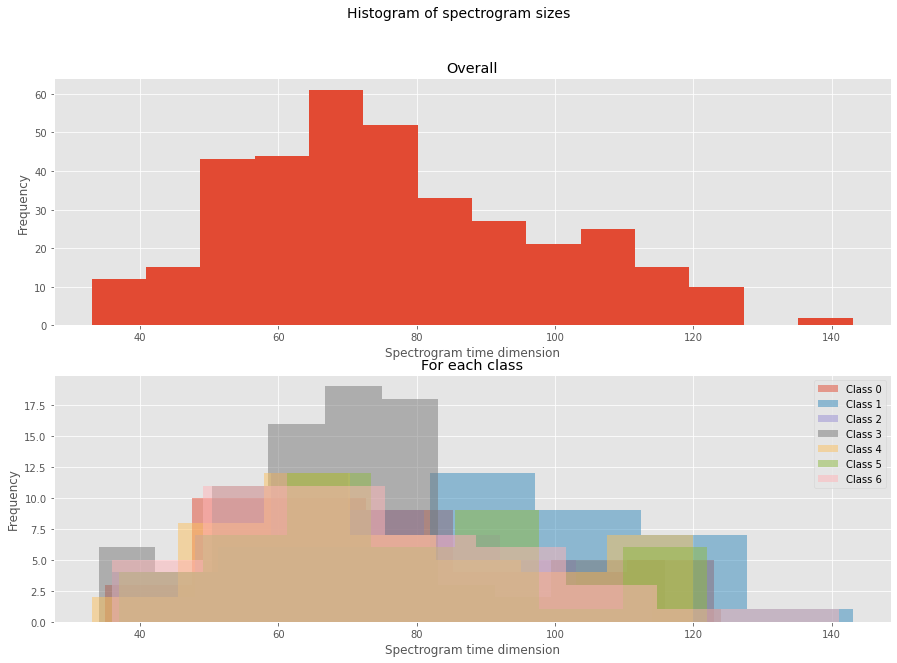

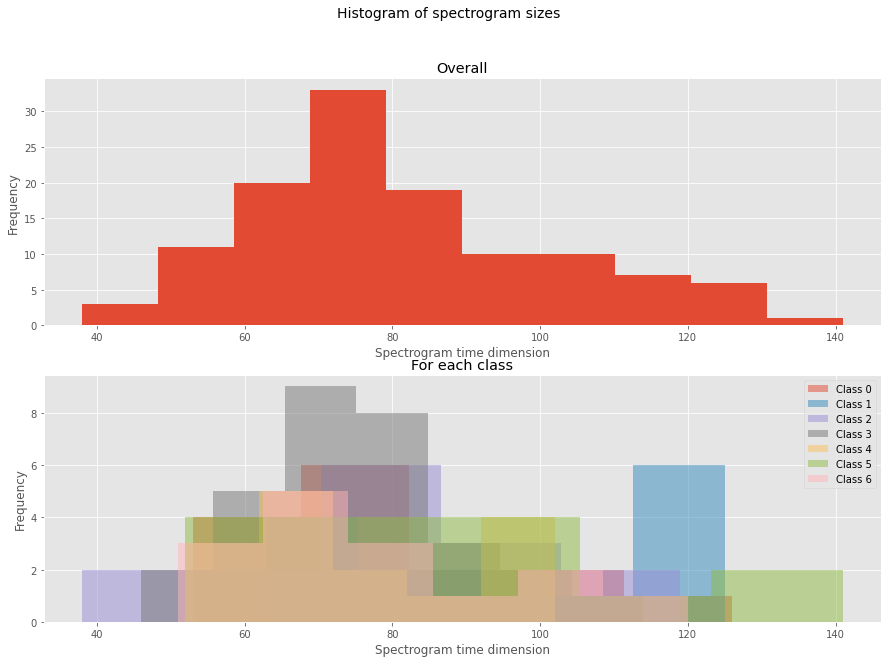

In [ ]:
train_dirs = ['train_data_savee/'+dir for dir in train_dir_savee]
eval_dirs = ['test_data_savee/'+dir for dir in test_dir_savee]
train_model(train_dirs,eval_dirs,'model')

  0%|          | 0/1399 [00:00<?, ?it/s]

Folder to index dict:
 {'train_data_tess/surprise': 0, 'train_data_tess/sad': 1, 'train_data_tess/fear': 2, 'train_data_tess/neutral': 3, 'train_data_tess/happy': 4, 'train_data_tess/disgust': 5, 'train_data_tess/angry': 6}
Folder to index dict:
 {'test_data_tess/surprise': 0, 'test_data_tess/sad': 1, 'test_data_tess/fear': 2, 'test_data_tess/neutral': 3, 'test_data_tess/happy': 4, 'test_data_tess/disgust': 5, 'test_data_tess/angry': 6}
0.05 0.05
Max sequence length in dataset: 60
-------Creating train set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 1399/1399 [00:08<00:00, 159.83it/s]


--> Plotting histogram of spectrogram sizes. 


  1%|          | 16/1398 [00:00<00:08, 159.03it/s]

--> Using zero padding with max_length = 60
-------Creating validation set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 1398/1398 [00:08<00:00, 159.00it/s]


--> Plotting histogram of spectrogram sizes. 
--> Using zero padding with max_length = 60
-----------------------------------
DEVICE: cuda
Model parameters:7634119


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



[tensor([[[-49.6993, -49.8554, -51.5685,  ..., -80.0000, -80.0000, -80.0000],
         [-31.0028, -46.6197, -59.2076,  ..., -62.5500, -65.1124, -62.5567],
         [-37.3078, -48.7227, -55.6752,  ..., -56.0088, -53.4967, -52.4538],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-34.0706, -35.0557, -47.2244,  ..., -80.0000, -80.0000, -80.0000],
         [-26.2323, -34.4257, -58.0040,  ..., -77.8738, -77.5427, -80.0000],
         [-23.4223, -36.3355, -55.7191,  ..., -71.4768, -72.5342, -69.7084],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-42.2225, -41.8686, -45.6837,  ..

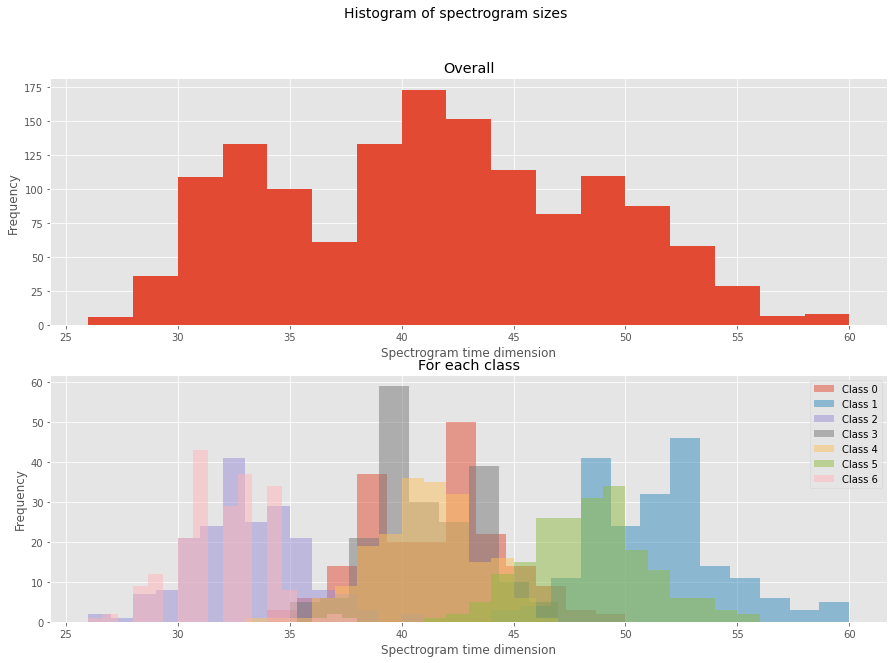

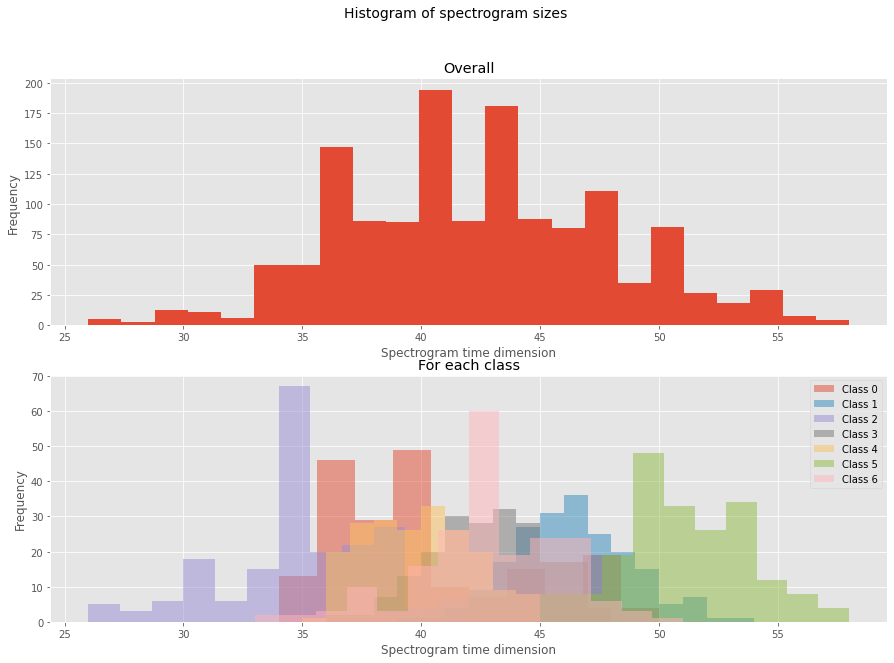

In [ ]:
train_dirs = ['train_data_tess/'+dir for dir in train_dir_tess]
eval_dirs = ['test_data_tess/'+dir for dir in test_dir_tess]
train_model(train_dirs,eval_dirs,'model')

In [ ]:
!rm -r './train_data_savee/disgust'
!rm -r './train_data_savee/neutral'
!rm -r './train_data_savee/surprise'
!rm -r './train_data_savee/fear'

!rm -r './test_data_savee/disgust'
!rm -r './test_data_savee/neutral'
!rm -r './test_data_savee/surprise'
!rm -r './test_data_savee/fear'

In [ ]:
folder2idx, idx2folder = folders_mapping(os.listdir('./train_data_savee'))
idx2folder

{0: 'sad', 1: 'happy', 2: 'angry'}

  7%|▋         | 9/135 [00:00<00:01, 82.33it/s]

Folder to index dict:
 {'train_data_savee/sad': 0, 'train_data_savee/happy': 1, 'train_data_savee/angry': 2}
Folder to index dict:
 {'test_data_savee/sad': 0, 'test_data_savee/happy': 1, 'test_data_savee/angry': 2}
0.05 0.05
Max sequence length in dataset: 143
-------Creating train set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 135/135 [00:01<00:00, 90.18it/s]


--> Plotting histogram of spectrogram sizes. 


 18%|█▊        | 8/45 [00:00<00:00, 76.14it/s]

--> Using zero padding with max_length = 143
-------Creating validation set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 45/45 [00:00<00:00, 87.26it/s]


--> Plotting histogram of spectrogram sizes. 
--> Using zero padding with max_length = 143
-----------------------------------
DEVICE: cuda
Model parameters:18118851


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



[tensor([[[-38.0571, -65.0297, -70.1839,  ..., -80.0000, -80.0000, -80.0000],
         [-37.9183, -80.0000, -73.6064,  ..., -80.0000, -80.0000, -80.0000],
         [-38.0653, -76.8098, -73.5137,  ..., -80.0000, -80.0000, -80.0000],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-13.5329, -58.4464, -45.6251,  ..., -80.0000, -80.0000, -80.0000],
         [-13.3664, -57.3349, -51.2670,  ..., -80.0000, -80.0000, -80.0000],
         [-13.4979, -57.2551, -57.5783,  ..., -80.0000, -80.0000, -80.0000],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-32.1884, -60.2918, -59.1251,  ..

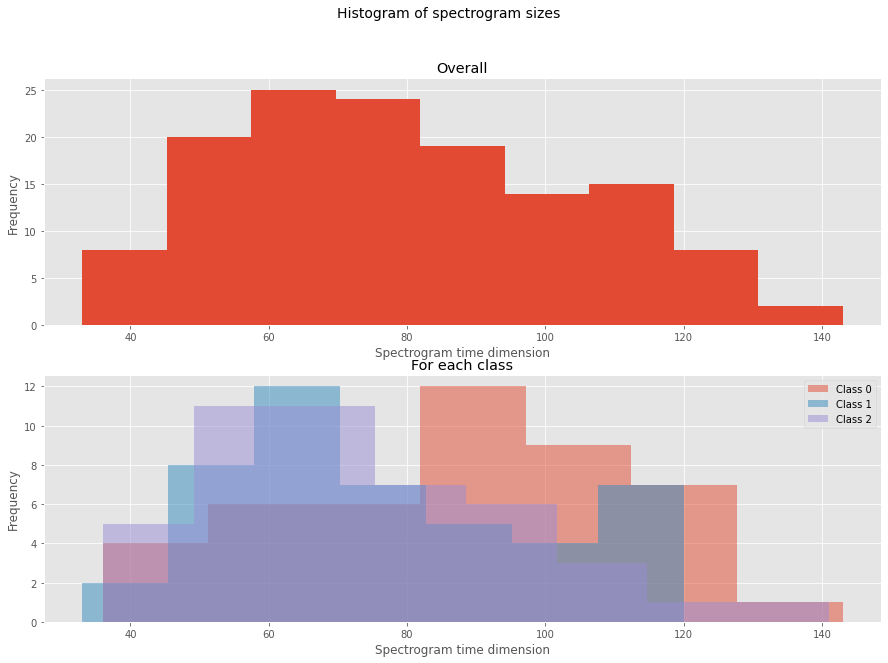

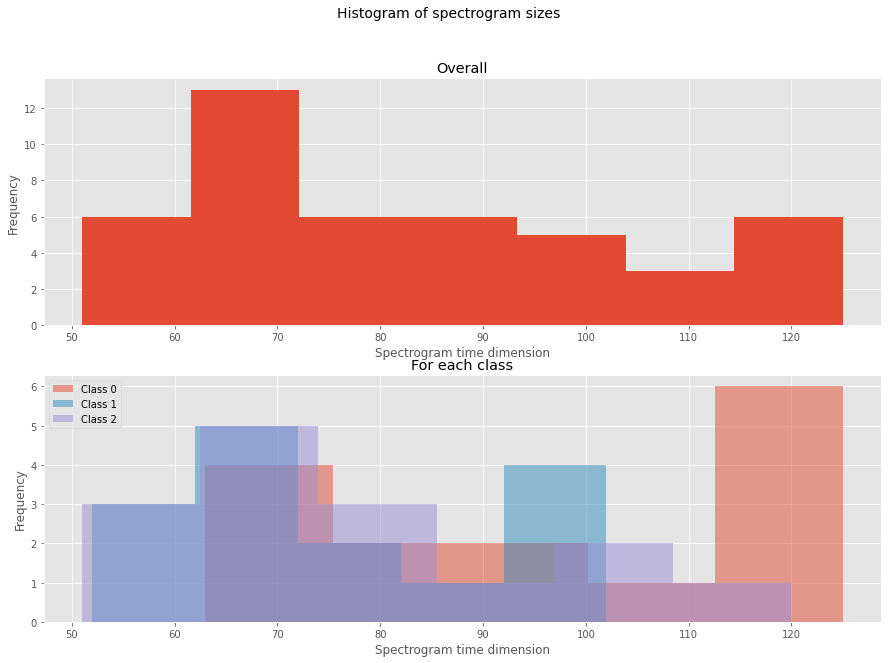

In [ ]:
train_dirs = ['train_data_savee/'+dir for dir in os.listdir('./train_data_savee')]
eval_dirs = ['test_data_savee/'+dir for dir in os.listdir('./test_data_savee')]
train_model(train_dirs,eval_dirs,'model_simplified_savee')

In [ ]:
!rm -r './train_data_tess/disgust'
!rm -r './train_data_tess/neutral'
!rm -r './train_data_tess/surprise'
!rm -r './train_data_tess/fear'

!rm -r './test_data_tess/disgust'
!rm -r './test_data_tess/neutral'
!rm -r './test_data_tess/surprise'
!rm -r './test_data_tess/fear'

In [ ]:
folder2idx, idx2folder = folders_mapping(os.listdir('./train_data_tess'))
idx2folder

{0: 'sad', 1: 'happy', 2: 'angry'}

  2%|▎         | 15/600 [00:00<00:03, 149.45it/s]

Folder to index dict:
 {'train_data_tess/sad': 0, 'train_data_tess/happy': 1, 'train_data_tess/angry': 2}
Folder to index dict:
 {'test_data_tess/sad': 0, 'test_data_tess/happy': 1, 'test_data_tess/angry': 2}
0.05 0.05
Max sequence length in dataset: 60
-------Creating train set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 600/600 [00:03<00:00, 159.40it/s]


--> Plotting histogram of spectrogram sizes. 


  3%|▎         | 16/599 [00:00<00:03, 156.45it/s]

--> Using zero padding with max_length = 60
-------Creating validation set-------
--> Extracting spectrogram associated features. . .


100%|██████████| 599/599 [00:03<00:00, 162.40it/s]


--> Plotting histogram of spectrogram sizes. 
--> Using zero padding with max_length = 60
-----------------------------------
DEVICE: cuda
Model parameters:7633091


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



[tensor([[[-45.9299, -43.5752, -51.7626,  ..., -77.3003, -77.4353, -80.0000],
         [-31.1385, -37.6412, -54.7342,  ..., -52.2208, -53.6556, -54.3120],
         [-35.5646, -44.7219, -54.4946,  ..., -40.0359, -41.9091, -42.3927],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-29.7118, -31.5005, -37.4669,  ..., -80.0000, -80.0000, -78.9262],
         [-25.0845, -35.0267, -52.1408,  ..., -54.0697, -52.2139, -51.3516],
         [-29.2619, -36.2132, -48.2697,  ..., -42.0566, -40.7188, -38.6056],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

        [[-46.7245, -46.3313, -48.9301,  ..

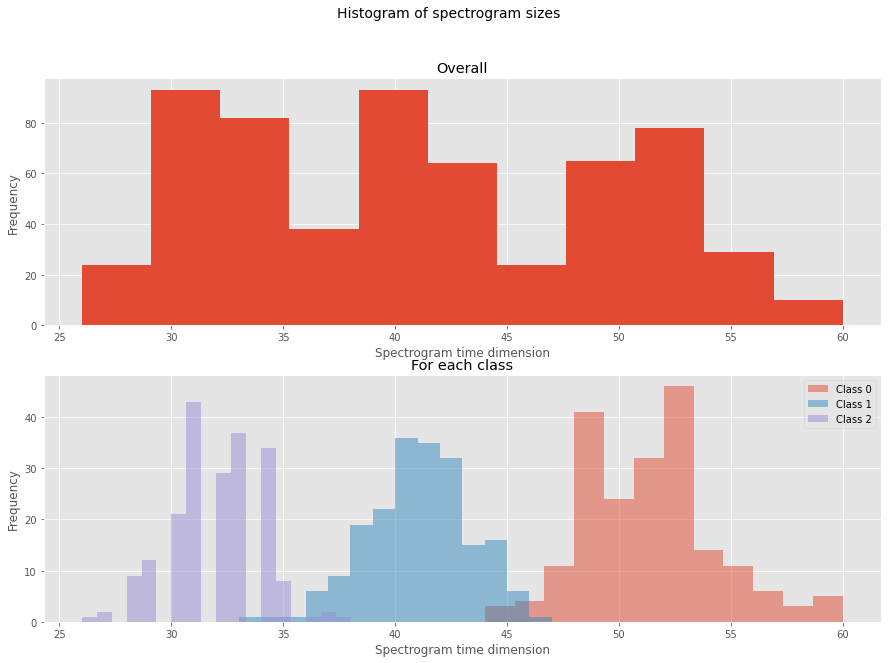

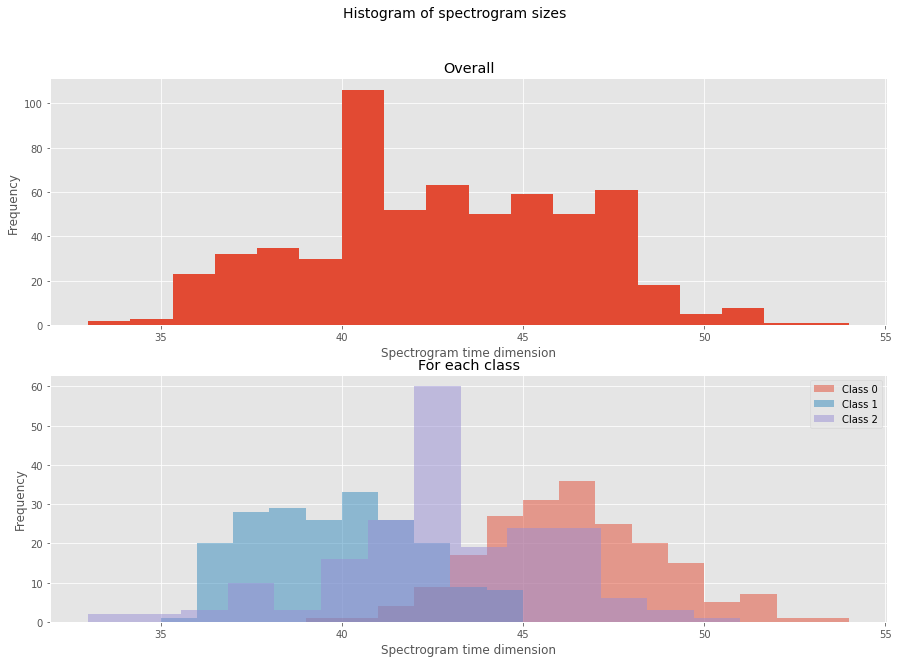

In [ ]:
train_dirs = ['train_data_tess/'+dir for dir in os.listdir('./train_data_tess')]
eval_dirs = ['test_data_tess/'+dir for dir in os.listdir('./test_data_tess')]
train_model(train_dirs,eval_dirs,'model_simplified_tess')

Not enough data.

### Conclusions
---
Emotion detection from audio samples is well defined task. Since it is multi-class problem, a lot of examples for each class are required to achieve decent results.

Both classical machine learning aproach with feature extraction and deep learning approach could not achieve accuracy score and f1 score larger than 51% on the 7 classes problem and larger than 69% on the simplified 3 class problem.

The low classification performance is mostly related to the classes themselves. As it can be seen on the analysis performed, some of the classes are not easily separable.

Both datasets contain recordings from actors trying to express the respective emotion. Due to this, bias is inserted since every actor express an emotion in their own way.

Future improvements would include:
- Upsampling the datasets by introducing noise to the audio samples.
- Investigate more datasets, to exclude the dataset bias.
- Use a pretrained deep neural network and transfer learning for fine tuning.
- Examine not only audio, but face expressions (emotion detection through Computer Vision) as well.